In [1]:
import numpy as np 
import pandas as pd 
import json
import os

from top2vec.Top2Vec.top2vec import Top2Vec

/home/keen/.pyenv/versions/3.9.13/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-10-13 12:26:53.401790: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760347613.414212 1015222 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1760347613.418057 1015222 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1760347613.428049 1015222 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than o

In [2]:
import torch
import evaluate
from transformers import AutoModelForSequenceClassification, TrainingArguments, Trainer
from nltk.tokenize import sent_tokenize
from tqdm import tqdm, trange
from transformers import AutoTokenizer
from transformers import DataCollatorWithPadding
import tarfile
import ngram

device = "cpu"

accuracy = evaluate.load("accuracy")

model = AutoModelForSequenceClassification.from_pretrained(
    "segm_model/my_model", num_labels=4)

import numpy as np

def compute_metrics(eval_pred):
    predictions, labels = eval_pred
    predictions = np.argmax(predictions, axis=1)
#    return accuracy.compute(predictions=predictions, references=labels)
    return f1.compute(predictions=predictions, references=labels, average='macro')


tokenizer = AutoTokenizer.from_pretrained("xlm-roberta-large")
data_collator = DataCollatorWithPadding(tokenizer=tokenizer, return_tensors = 'pt')

training_args = TrainingArguments(
    output_dir="segm_model/my_model",
    learning_rate=2e-5,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    num_train_epochs=8,
    weight_decay=0.01,
    no_cuda=True
)

trainer = Trainer(
    model=model,
    args=training_args,
    #train_dataset=tokenized_ds["train"],
    #eval_dataset=tokenized_ds["test"],
    tokenizer=tokenizer,
    data_collator=data_collator,
    compute_metrics=compute_metrics,
)


def remove_trash(txt_):
    txts = []
    texts = sent_tokenize(txt_)
    for txt in texts:
        tokens = tokenizer(txt, truncation=True)
        predictions = trainer.predict([tokens])
        lbl = np.argmax(predictions.predictions, axis=-1)
        if lbl != 1:
            txts.append(txt)
    return " ".join(txts)        
            
def grab_arxiv_txt(titles):
    titles = {t[:t.find("|")].lower().strip() for t in titles}
    G = ngram.NGram(titles)

    arx_dir = "/data2/arxiv"
    arh = "2030_arxiv_json_dump.tar.gz"

    to_extract = {}
    datas = {}
    cntr202 = 0
    try:
        with tarfile.open(os.path.join(arx_dir, arh), 'r:gz') as tar:
            for member in tqdm(tar):
                if member.isfile():
                    if member.name.endswith(".json"):
                        file_obj = tar.extractfile(member)
                        meta_str = file_obj.read().decode("utf-8")
                        meta = json.loads(meta_str)["meta"]
                        name = member.name[member.name.rfind("/")+1:member.name.rfind(".json")]
                        if "202" in meta:
                            cntr202 += 1
                            title_res = G.search(meta["202"].lower().strip(), threshold=0.7)
                            if len(title_res) > 0:
                                to_extract[name] = title_res[0][0]    
        print(len(to_extract), cntr202)                        
        with tarfile.open(os.path.join(arx_dir, arh), 'r:gz') as tar:
            for member in tqdm(tar):
                if member.isfile():
                    if member.name.endswith(".txt"):     
                        name = member.name[member.name.rfind("/")+1:member.name.rfind(".txt")]
                        if name in to_extract:
                            file_obj = tar.extractfile(member)
                            if file_obj:
                                content = file_obj.read().decode("utf-8")    
                                datas[to_extract[name]] = content
                                        
    except Exception as e:
        print(e)
    return datas

def preprocess_reviews(fname): 
    df = pd.read_excel(fname)
    dat = []
    j = 0
    titles = df["title"].to_list()
    content = grab_arxiv_txt(titles)
    for i, row in tqdm(df.iterrows()):
        text = content.get(row["title"][:row["title"].find("|")].lower().strip(),"")
        text = text.replace("Published as a conference paper at ICLR "," ")    
        text = text.replace("Under review as a conference paper at ICLR "," ").replace("\n"," ")    
        if len(text) < 1:
            text = row["title"][:row["title"].find("|")]
        dat.append([i,row['rate'],row["title"][:row["title"].find("|")],row["title"][:row["title"].find("|")] + " " + remove_trash(row["review"]),text])
        # if j > 100:
        #     break
        j += 1
    return pd.DataFrame(dat,columns=("id","score","title","review","text"))

def getTexts(cell):
    res = []
    for i in range(len(cell)):
        c = cell[i]['content']
        res.append(c[c.find("Summary") + 7:])
    return res    

def preprocess_westlake():
    df = pd.read_json(path_or_buf="train.jsonl", lines=True)
    for i, row in df.iterrows():
        texts = getTexts(row["review_contexts"])
        for t in texts:
            dat.append([i,row["title"] + " " + remove_trash(t)])    

    return pd.DataFrame(dat,columns=("id","text"))    
    

/home/keen/.pyenv/versions/3.9.13/lib/python3.9/site-packages/transformers/training_args.py:1604: FutureWarning: using `no_cuda` is deprecated and will be removed in version 5.0 of 🤗 Transformers. Use `use_cpu` instead
  warnings.warn(
/tmp/ipykernel_1015222/1811670562.py:40: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


# ICLR 2018

In [3]:
rews = preprocess_reviews("tp_2018conference.xlsx")

4019617it [1:38:41, 678.86it/s]


584 2009790


4019617it [10:20, 6483.24it/s] 
0it [00:00, ?it/s]

1it [00:02,  2.89s/it]

2it [00:06,  3.13s/it]

3it [00:08,  2.65s/it]

4it [00:16,  4.95s/it]

5it [00:18,  3.73s/it]

6it [00:20,  3.07s/it]

7it [00:22,  2.98s/it]

8it [00:26,  3.14s/it]

9it [00:31,  3.64s/it]

10it [00:33,  3.11s/it]

11it [00:33,  2.30s/it]

12it [00:35,  2.14s/it]

13it [00:38,  2.42s/it]

14it [00:38,  1.87s/it]

15it [00:42,  2.36s/it]

16it [00:45,  2.67s/it]

17it [00:48,  2.65s/it]

18it [00:49,  2.14s/it]

19it [00:50,  1.72s/it]

20it [00:51,  1.71s/it]

21it [00:52,  1.55s/it]

22it [00:53,  1.32s/it]

23it [00:58,  2.19s/it]

24it [01:00,  2.17s/it]

25it [01:02,  2.29s/it]

26it [01:04,  2.06s/it]

27it [01:07,  2.38s/it]

28it [01:08,  2.15s/it]

29it [01:12,  2.42s/it]

30it [01:14,  2.30s/it]

31it [01:18,  2.92s/it]

32it [01:19,  2.47s/it]

33it [01:21,  2.21s/it]

34it [01:22,  1.84s/it]

35it [01:28,  3.00s/it]

36it [01:31,  3.26s/it]

37it [01:33,  2.87s/it]

38it [01:35,  2.39s/it]

39it [01:41,  3.46s/it]

40it [01:43,  3.08s/it]

41it [01:48,  3.68s/it]

42it [01:51,  3.60s/it]

43it [01:55,  3.54s/it]

44it [01:56,  2.71s/it]

45it [01:59,  2.98s/it]

46it [02:01,  2.52s/it]

47it [02:03,  2.43s/it]

48it [02:05,  2.49s/it]

49it [02:06,  1.99s/it]

50it [02:07,  1.71s/it]

51it [02:11,  2.17s/it]

52it [02:13,  2.14s/it]

53it [02:14,  1.88s/it]

54it [02:15,  1.56s/it]

55it [02:17,  1.73s/it]

56it [02:19,  1.79s/it]

57it [02:20,  1.60s/it]

58it [02:21,  1.43s/it]

59it [02:23,  1.49s/it]

60it [02:23,  1.23s/it]

61it [02:24,  1.04s/it]

62it [02:26,  1.40s/it]

63it [02:28,  1.49s/it]

64it [02:30,  1.77s/it]

65it [02:32,  1.73s/it]

66it [02:33,  1.68s/it]

67it [02:34,  1.42s/it]

68it [02:38,  2.17s/it]

69it [02:39,  1.79s/it]

70it [02:40,  1.47s/it]

71it [02:41,  1.41s/it]

72it [02:43,  1.47s/it]

73it [02:45,  1.78s/it]

74it [02:47,  1.76s/it]

75it [02:49,  1.74s/it]

76it [02:49,  1.47s/it]

77it [02:53,  2.00s/it]

78it [02:58,  2.94s/it]

79it [02:59,  2.46s/it]

80it [03:00,  1.85s/it]

81it [03:02,  1.90s/it]

82it [03:04,  2.02s/it]

83it [03:07,  2.32s/it]

84it [03:08,  2.02s/it]

85it [03:12,  2.60s/it]

86it [03:14,  2.24s/it]

87it [03:16,  2.24s/it]

88it [03:16,  1.74s/it]

89it [03:18,  1.61s/it]

90it [03:21,  2.18s/it]

91it [03:24,  2.24s/it]

92it [03:29,  3.10s/it]

93it [03:30,  2.72s/it]

94it [03:34,  2.95s/it]

95it [03:35,  2.48s/it]

96it [03:36,  2.03s/it]

97it [03:41,  2.75s/it]

98it [03:43,  2.50s/it]

99it [03:45,  2.29s/it]

100it [03:48,  2.66s/it]

101it [03:50,  2.31s/it]

102it [03:50,  1.82s/it]

103it [03:51,  1.64s/it]

104it [03:53,  1.53s/it]

105it [03:54,  1.46s/it]

106it [03:58,  2.08s/it]

107it [04:00,  2.24s/it]

108it [04:02,  2.04s/it]

109it [04:02,  1.63s/it]

110it [04:05,  1.83s/it]

111it [04:06,  1.74s/it]

112it [04:09,  2.12s/it]

113it [04:10,  1.58s/it]

114it [04:10,  1.31s/it]

115it [04:14,  1.96s/it]

116it [04:16,  2.17s/it]

117it [04:18,  2.14s/it]

118it [04:21,  2.18s/it]

119it [04:22,  1.94s/it]

120it [04:24,  1.94s/it]

121it [04:28,  2.64s/it]

122it [04:35,  3.95s/it]

123it [04:41,  4.45s/it]

124it [04:43,  3.64s/it]

125it [04:45,  3.31s/it]

126it [04:46,  2.67s/it]

127it [04:48,  2.39s/it]

128it [04:49,  2.08s/it]

129it [04:53,  2.49s/it]

130it [04:57,  2.87s/it]

131it [04:58,  2.37s/it]

132it [04:59,  1.94s/it]

133it [05:01,  2.04s/it]

134it [05:07,  3.09s/it]

135it [05:09,  2.89s/it]

136it [05:14,  3.60s/it]

137it [05:16,  3.12s/it]

138it [05:19,  2.93s/it]

139it [05:21,  2.69s/it]

140it [05:23,  2.40s/it]

141it [05:25,  2.46s/it]

142it [05:28,  2.63s/it]

143it [05:30,  2.21s/it]

144it [05:33,  2.52s/it]

145it [05:34,  2.17s/it]

146it [05:38,  2.83s/it]

147it [05:41,  2.71s/it]

148it [05:43,  2.50s/it]

149it [05:45,  2.41s/it]

150it [05:48,  2.68s/it]

151it [05:52,  3.02s/it]

152it [05:53,  2.31s/it]

153it [05:56,  2.63s/it]

154it [06:03,  3.94s/it]

155it [06:04,  2.98s/it]

156it [06:05,  2.27s/it]

157it [06:07,  2.22s/it]

158it [06:09,  2.36s/it]

159it [06:12,  2.51s/it]

160it [06:15,  2.63s/it]

161it [06:18,  2.82s/it]

162it [06:20,  2.40s/it]

163it [06:23,  2.51s/it]

164it [06:26,  2.74s/it]

165it [06:27,  2.22s/it]

166it [06:28,  1.86s/it]

167it [06:29,  1.51s/it]

168it [06:32,  2.06s/it]

169it [06:33,  1.86s/it]

170it [06:39,  3.05s/it]

171it [06:40,  2.37s/it]

172it [06:41,  1.88s/it]

173it [06:42,  1.74s/it]

174it [06:42,  1.32s/it]

175it [06:44,  1.27s/it]

176it [06:46,  1.48s/it]

177it [06:48,  1.75s/it]

178it [06:49,  1.63s/it]

179it [06:54,  2.66s/it]

180it [06:55,  2.14s/it]

181it [07:01,  3.30s/it]

182it [07:04,  3.07s/it]

183it [07:07,  3.15s/it]

184it [07:10,  3.06s/it]

185it [07:13,  3.11s/it]

186it [07:15,  2.72s/it]

187it [07:17,  2.44s/it]

188it [07:19,  2.41s/it]

189it [07:20,  1.79s/it]

190it [07:22,  1.88s/it]

191it [07:25,  2.27s/it]

192it [07:26,  1.96s/it]

193it [07:28,  1.81s/it]

194it [07:32,  2.49s/it]

195it [07:33,  2.26s/it]

196it [07:37,  2.68s/it]

197it [07:39,  2.40s/it]

198it [07:47,  4.30s/it]

199it [07:49,  3.34s/it]

200it [07:50,  2.73s/it]

201it [07:53,  2.77s/it]

202it [07:54,  2.27s/it]

203it [07:54,  1.65s/it]

204it [07:56,  1.65s/it]

205it [07:57,  1.70s/it]

206it [08:02,  2.53s/it]

207it [08:04,  2.26s/it]

208it [08:09,  3.08s/it]

209it [08:11,  2.97s/it]

210it [08:12,  2.18s/it]

211it [08:15,  2.52s/it]

212it [08:17,  2.23s/it]

213it [08:21,  3.00s/it]

214it [08:23,  2.52s/it]

215it [08:25,  2.42s/it]

216it [08:26,  2.13s/it]

217it [08:30,  2.51s/it]

218it [08:33,  2.60s/it]

219it [08:38,  3.46s/it]

220it [08:41,  3.45s/it]

221it [08:44,  3.07s/it]

222it [08:44,  2.38s/it]

223it [08:48,  2.65s/it]

224it [08:50,  2.45s/it]

225it [08:53,  2.73s/it]

226it [08:58,  3.29s/it]

227it [09:02,  3.49s/it]

228it [09:06,  3.88s/it]

229it [09:08,  3.06s/it]

230it [09:10,  2.84s/it]

231it [09:14,  3.35s/it]

232it [09:18,  3.39s/it]

233it [09:27,  5.25s/it]

234it [09:30,  4.47s/it]

235it [09:33,  4.04s/it]

236it [09:34,  3.07s/it]

237it [09:36,  2.63s/it]

238it [09:39,  2.85s/it]

239it [09:43,  3.17s/it]

240it [09:46,  3.24s/it]

241it [09:48,  2.81s/it]

242it [09:50,  2.50s/it]

243it [09:51,  2.00s/it]

244it [09:53,  2.05s/it]

245it [09:59,  3.32s/it]

246it [10:04,  3.89s/it]

247it [10:09,  4.09s/it]

248it [10:11,  3.40s/it]

249it [10:16,  4.06s/it]

250it [10:19,  3.79s/it]

251it [10:22,  3.30s/it]

252it [10:27,  3.86s/it]

253it [10:29,  3.42s/it]

254it [10:30,  2.59s/it]

255it [10:32,  2.55s/it]

256it [10:35,  2.51s/it]

257it [10:36,  2.13s/it]

258it [10:38,  2.00s/it]

259it [10:40,  2.16s/it]

260it [10:43,  2.43s/it]

261it [10:47,  2.71s/it]

262it [10:54,  4.23s/it]

263it [11:02,  5.16s/it]

264it [11:04,  4.40s/it]

265it [11:06,  3.60s/it]

266it [11:09,  3.36s/it]

267it [11:10,  2.74s/it]

268it [11:14,  3.06s/it]

269it [11:16,  2.78s/it]

270it [11:19,  2.82s/it]

271it [11:22,  2.77s/it]

272it [11:24,  2.54s/it]

273it [11:27,  2.73s/it]

274it [11:28,  2.32s/it]

275it [11:31,  2.35s/it]

276it [11:33,  2.48s/it]

277it [11:35,  2.18s/it]

278it [11:36,  1.84s/it]

279it [11:39,  2.31s/it]

280it [11:45,  3.29s/it]

281it [11:46,  2.74s/it]

282it [11:48,  2.48s/it]

283it [11:50,  2.27s/it]

284it [11:53,  2.40s/it]

285it [11:54,  1.99s/it]

286it [11:55,  1.85s/it]

287it [11:57,  1.91s/it]

288it [11:59,  1.81s/it]

289it [12:00,  1.74s/it]

290it [12:03,  1.84s/it]

291it [12:05,  2.11s/it]

292it [12:07,  2.07s/it]

293it [12:11,  2.48s/it]

294it [12:13,  2.35s/it]

295it [12:16,  2.52s/it]

296it [12:18,  2.34s/it]

297it [12:19,  1.96s/it]

298it [12:20,  1.72s/it]

299it [12:22,  1.83s/it]

300it [12:22,  1.37s/it]

301it [12:23,  1.17s/it]

302it [12:25,  1.38s/it]

303it [12:26,  1.29s/it]

304it [12:27,  1.25s/it]

305it [12:28,  1.30s/it]

306it [12:31,  1.62s/it]

307it [12:34,  2.17s/it]

308it [12:36,  1.96s/it]

309it [12:37,  1.78s/it]

310it [12:40,  2.20s/it]

311it [12:42,  1.99s/it]

312it [12:44,  2.10s/it]

313it [12:45,  1.86s/it]

314it [12:47,  1.82s/it]

315it [12:49,  1.84s/it]

316it [12:52,  2.15s/it]

317it [12:54,  2.08s/it]

318it [12:57,  2.35s/it]

319it [13:00,  2.61s/it]

320it [13:01,  2.23s/it]

321it [13:03,  2.04s/it]

322it [13:04,  1.88s/it]

323it [13:07,  2.12s/it]

324it [13:09,  2.06s/it]

325it [13:10,  1.83s/it]

326it [13:18,  3.49s/it]

327it [13:20,  3.09s/it]

328it [13:21,  2.48s/it]

329it [13:23,  2.45s/it]

330it [13:27,  2.84s/it]

331it [13:28,  2.40s/it]

332it [13:30,  2.06s/it]

333it [13:33,  2.32s/it]

334it [13:34,  2.02s/it]

335it [13:37,  2.39s/it]

336it [13:39,  2.12s/it]

337it [13:42,  2.40s/it]

338it [13:45,  2.69s/it]

339it [13:46,  2.30s/it]

340it [13:48,  2.11s/it]

341it [13:52,  2.61s/it]

342it [13:54,  2.36s/it]

343it [13:55,  2.17s/it]

344it [13:58,  2.28s/it]

345it [14:02,  2.69s/it]

346it [14:02,  2.06s/it]

347it [14:04,  2.04s/it]

348it [14:05,  1.74s/it]

349it [14:06,  1.46s/it]

350it [14:07,  1.37s/it]

351it [14:11,  1.96s/it]

352it [14:13,  2.18s/it]

353it [14:15,  2.18s/it]

354it [14:21,  3.31s/it]

355it [14:23,  2.75s/it]

356it [14:27,  3.22s/it]

357it [14:31,  3.41s/it]

358it [14:33,  3.12s/it]

359it [14:36,  2.81s/it]

360it [14:41,  3.62s/it]

361it [14:42,  2.71s/it]

362it [14:43,  2.46s/it]

363it [14:47,  2.63s/it]

364it [14:48,  2.32s/it]

365it [14:49,  1.99s/it]

366it [14:53,  2.54s/it]

367it [14:59,  3.39s/it]

368it [15:00,  2.92s/it]

369it [15:02,  2.46s/it]

370it [15:04,  2.28s/it]

371it [15:04,  1.80s/it]

372it [15:09,  2.53s/it]

373it [15:12,  2.76s/it]

374it [15:16,  3.19s/it]

375it [15:18,  2.75s/it]

376it [15:19,  2.32s/it]

377it [15:21,  2.24s/it]

378it [15:23,  2.15s/it]

379it [15:25,  2.00s/it]

380it [15:26,  1.68s/it]

381it [15:28,  1.97s/it]

382it [15:30,  1.94s/it]

383it [15:40,  4.34s/it]

384it [15:43,  3.84s/it]

385it [15:45,  3.49s/it]

386it [15:48,  3.23s/it]

387it [15:52,  3.59s/it]

388it [15:55,  3.19s/it]

389it [15:56,  2.70s/it]

390it [16:01,  3.17s/it]

391it [16:02,  2.67s/it]

392it [16:03,  2.16s/it]

393it [16:06,  2.29s/it]

394it [16:09,  2.74s/it]

395it [16:10,  2.14s/it]

396it [16:11,  1.83s/it]

397it [16:13,  1.71s/it]

398it [16:13,  1.27s/it]

399it [16:14,  1.21s/it]

400it [16:17,  1.81s/it]

401it [16:25,  3.48s/it]

402it [16:27,  3.28s/it]

403it [16:31,  3.49s/it]

404it [16:34,  3.13s/it]

405it [16:36,  2.93s/it]

406it [16:39,  2.78s/it]

407it [16:40,  2.45s/it]

408it [16:42,  2.25s/it]

409it [16:44,  2.20s/it]

410it [16:45,  1.94s/it]

411it [16:48,  2.25s/it]

412it [16:51,  2.23s/it]

413it [16:54,  2.67s/it]

414it [17:00,  3.67s/it]

415it [17:11,  5.88s/it]

416it [17:14,  4.97s/it]

417it [17:16,  3.95s/it]

418it [17:21,  4.23s/it]

419it [17:24,  3.95s/it]

420it [17:27,  3.56s/it]

421it [17:29,  3.12s/it]

422it [17:32,  3.31s/it]

423it [17:35,  3.05s/it]

424it [17:37,  2.91s/it]

425it [17:40,  2.82s/it]

426it [17:44,  3.04s/it]

427it [17:47,  3.24s/it]

428it [17:50,  3.08s/it]

429it [17:51,  2.45s/it]

430it [17:57,  3.65s/it]

431it [17:59,  2.97s/it]

432it [18:00,  2.53s/it]

433it [18:03,  2.56s/it]

434it [18:04,  2.14s/it]

435it [18:06,  2.13s/it]

436it [18:11,  2.80s/it]

437it [18:14,  2.99s/it]

438it [18:18,  3.41s/it]

439it [18:22,  3.47s/it]

440it [18:32,  5.53s/it]

441it [18:35,  4.68s/it]

442it [18:38,  4.23s/it]

443it [19:02, 10.19s/it]

444it [19:05,  7.89s/it]

445it [19:10,  6.96s/it]

446it [19:11,  5.17s/it]

447it [19:15,  4.84s/it]

448it [19:16,  3.86s/it]

449it [19:18,  3.30s/it]

450it [19:21,  3.23s/it]

451it [19:24,  2.93s/it]

452it [19:31,  4.21s/it]

453it [19:32,  3.17s/it]

454it [19:34,  2.83s/it]

455it [19:35,  2.51s/it]

456it [19:37,  2.41s/it]

457it [19:39,  2.23s/it]

458it [19:43,  2.72s/it]

459it [19:46,  2.76s/it]

460it [19:52,  3.74s/it]

461it [19:56,  3.94s/it]

462it [19:58,  3.16s/it]

463it [20:02,  3.51s/it]

464it [20:03,  2.85s/it]

465it [20:05,  2.48s/it]

466it [20:09,  2.95s/it]

467it [20:10,  2.32s/it]

468it [20:11,  1.98s/it]

469it [20:17,  3.02s/it]

470it [20:24,  4.27s/it]

471it [20:28,  4.39s/it]

472it [20:31,  3.74s/it]

473it [20:35,  3.88s/it]

474it [20:38,  3.76s/it]

475it [20:42,  3.63s/it]

476it [20:45,  3.55s/it]

477it [20:48,  3.28s/it]

478it [20:50,  3.07s/it]

479it [20:52,  2.79s/it]

480it [20:54,  2.53s/it]

481it [20:57,  2.49s/it]

482it [20:58,  2.25s/it]

483it [21:03,  2.83s/it]

484it [21:05,  2.68s/it]

485it [21:11,  3.75s/it]

486it [21:15,  3.71s/it]

487it [21:20,  4.15s/it]

488it [21:25,  4.49s/it]

489it [21:29,  4.28s/it]

490it [21:31,  3.69s/it]

491it [21:34,  3.22s/it]

492it [21:36,  3.05s/it]

493it [21:41,  3.66s/it]

494it [21:46,  3.99s/it]

495it [21:49,  3.68s/it]

496it [21:51,  3.19s/it]

497it [21:54,  3.22s/it]

498it [22:00,  3.86s/it]

499it [22:03,  3.62s/it]

500it [22:06,  3.61s/it]

501it [22:10,  3.50s/it]

502it [22:13,  3.36s/it]

503it [22:17,  3.64s/it]

504it [22:18,  2.91s/it]

505it [22:21,  2.83s/it]

506it [22:24,  3.06s/it]

507it [22:27,  2.97s/it]

508it [22:29,  2.63s/it]

509it [22:32,  2.88s/it]

510it [22:38,  3.63s/it]

511it [22:40,  3.16s/it]

512it [22:42,  2.75s/it]

513it [22:54,  5.68s/it]

514it [23:01,  5.90s/it]

515it [23:05,  5.53s/it]

516it [23:08,  4.64s/it]

517it [23:08,  3.42s/it]

518it [23:12,  3.46s/it]

519it [23:14,  2.98s/it]

520it [23:17,  2.92s/it]

521it [23:18,  2.38s/it]

522it [23:23,  3.37s/it]

523it [23:30,  4.33s/it]

524it [23:34,  4.36s/it]

525it [23:35,  3.34s/it]

526it [23:43,  4.63s/it]

527it [23:43,  3.40s/it]

528it [23:44,  2.65s/it]

529it [23:46,  2.48s/it]

530it [23:49,  2.62s/it]

531it [23:52,  2.65s/it]

532it [23:55,  2.74s/it]

533it [24:02,  3.89s/it]

534it [24:02,  2.94s/it]

535it [24:04,  2.54s/it]

536it [24:07,  2.55s/it]

537it [24:08,  2.11s/it]

538it [24:10,  2.07s/it]

539it [24:14,  2.89s/it]

540it [24:25,  5.16s/it]

541it [24:33,  5.98s/it]

542it [24:37,  5.41s/it]

543it [24:45,  6.19s/it]

544it [24:47,  5.02s/it]

545it [24:52,  4.96s/it]

546it [24:55,  4.36s/it]

547it [24:56,  3.52s/it]

548it [25:01,  3.82s/it]

549it [25:02,  3.07s/it]

550it [25:03,  2.41s/it]

551it [25:08,  3.00s/it]

552it [25:09,  2.60s/it]

553it [25:11,  2.29s/it]

554it [25:12,  1.83s/it]

555it [25:14,  2.01s/it]

556it [25:20,  3.30s/it]

557it [25:22,  2.96s/it]

558it [25:29,  4.16s/it]

559it [25:33,  4.05s/it]

560it [25:35,  3.41s/it]

561it [25:37,  3.10s/it]

562it [25:42,  3.53s/it]

563it [25:45,  3.27s/it]

564it [25:47,  3.04s/it]

565it [25:50,  3.07s/it]

566it [25:53,  2.81s/it]

567it [25:55,  2.56s/it]

568it [25:59,  3.13s/it]

569it [26:01,  2.89s/it]

570it [26:06,  3.46s/it]

571it [26:10,  3.68s/it]

572it [26:18,  4.98s/it]

573it [26:22,  4.57s/it]

574it [26:28,  5.14s/it]

575it [26:33,  4.83s/it]

576it [26:35,  4.20s/it]

577it [26:38,  3.79s/it]

578it [26:41,  3.45s/it]

579it [26:42,  2.93s/it]

580it [26:47,  3.51s/it]

581it [26:50,  3.18s/it]

582it [26:57,  4.55s/it]

583it [27:00,  3.99s/it]

584it [27:02,  3.34s/it]

585it [27:04,  2.81s/it]

586it [27:18,  6.32s/it]

587it [27:20,  5.10s/it]

588it [27:22,  4.17s/it]

589it [27:27,  4.21s/it]

590it [27:29,  3.72s/it]

591it [27:31,  3.08s/it]

592it [27:35,  3.28s/it]

593it [27:42,  4.50s/it]

594it [27:43,  3.62s/it]

595it [27:45,  2.96s/it]

596it [27:47,  2.70s/it]

597it [27:48,  2.18s/it]

598it [27:50,  2.25s/it]

599it [27:53,  2.40s/it]

600it [27:58,  3.11s/it]

601it [28:01,  3.01s/it]

602it [28:04,  3.03s/it]

603it [28:05,  2.53s/it]

604it [28:06,  2.12s/it]

605it [28:10,  2.52s/it]

606it [28:16,  3.66s/it]

607it [28:22,  4.40s/it]

608it [28:28,  4.72s/it]

609it [28:32,  4.60s/it]

610it [28:35,  4.18s/it]

611it [28:37,  3.53s/it]

612it [28:41,  3.50s/it]

613it [28:44,  3.51s/it]

614it [28:45,  2.83s/it]

615it [28:47,  2.59s/it]

616it [28:51,  2.80s/it]

617it [28:55,  3.12s/it]

618it [28:55,  2.43s/it]

619it [28:57,  2.33s/it]

620it [29:00,  2.45s/it]

621it [29:05,  3.09s/it]

622it [29:07,  2.70s/it]

623it [29:09,  2.52s/it]

624it [29:10,  2.17s/it]

625it [29:14,  2.62s/it]

626it [29:19,  3.35s/it]

627it [29:20,  2.61s/it]

628it [29:22,  2.54s/it]

629it [29:24,  2.34s/it]

630it [29:29,  3.13s/it]

631it [29:30,  2.64s/it]

632it [29:32,  2.42s/it]

633it [29:36,  2.89s/it]

634it [29:38,  2.66s/it]

635it [29:40,  2.23s/it]

636it [29:46,  3.63s/it]

637it [29:53,  4.47s/it]

638it [29:58,  4.57s/it]

639it [30:01,  4.13s/it]

640it [30:05,  4.01s/it]

641it [30:10,  4.47s/it]

642it [30:14,  4.28s/it]

643it [30:16,  3.54s/it]

644it [30:19,  3.50s/it]

645it [30:23,  3.69s/it]

646it [30:27,  3.73s/it]

647it [30:31,  3.82s/it]

648it [30:35,  3.74s/it]

649it [30:36,  3.00s/it]

650it [30:38,  2.82s/it]

651it [30:42,  3.02s/it]

652it [30:44,  2.80s/it]

653it [30:49,  3.31s/it]

654it [30:51,  2.94s/it]

655it [30:53,  2.76s/it]

656it [30:55,  2.44s/it]

657it [30:56,  2.09s/it]

658it [31:00,  2.58s/it]

659it [31:01,  2.11s/it]

660it [31:05,  2.70s/it]

661it [31:06,  2.15s/it]

662it [31:07,  1.86s/it]

663it [31:09,  1.89s/it]

664it [31:11,  1.92s/it]

665it [31:14,  2.20s/it]

666it [31:15,  1.99s/it]

667it [31:18,  2.22s/it]

668it [31:20,  2.14s/it]

669it [31:25,  2.96s/it]

670it [31:30,  3.65s/it]

671it [31:37,  4.77s/it]

672it [31:39,  3.93s/it]

673it [31:44,  4.12s/it]

674it [31:46,  3.49s/it]

675it [31:48,  3.11s/it]

676it [31:53,  3.73s/it]

677it [31:56,  3.29s/it]

678it [32:00,  3.68s/it]

679it [32:03,  3.42s/it]

680it [32:12,  5.23s/it]

681it [32:15,  4.47s/it]

682it [32:25,  5.99s/it]

683it [32:29,  5.36s/it]

684it [32:34,  5.36s/it]

685it [32:37,  4.66s/it]

686it [32:42,  4.89s/it]

687it [32:45,  4.21s/it]

688it [32:50,  4.45s/it]

689it [32:58,  5.59s/it]

690it [33:03,  5.43s/it]

691it [33:08,  5.21s/it]

692it [33:12,  4.85s/it]

693it [33:14,  4.11s/it]

694it [33:20,  4.64s/it]

695it [33:24,  4.33s/it]

696it [33:27,  4.05s/it]

697it [33:33,  4.58s/it]

698it [33:38,  4.68s/it]

699it [33:41,  4.26s/it]

700it [33:47,  4.77s/it]

701it [33:50,  4.32s/it]

702it [33:57,  4.86s/it]

703it [34:06,  6.08s/it]

704it [34:14,  6.66s/it]

705it [34:18,  5.88s/it]

706it [34:21,  5.24s/it]

707it [34:26,  4.97s/it]

708it [34:38,  7.25s/it]

709it [34:42,  6.33s/it]

710it [34:45,  5.20s/it]

711it [35:02,  8.61s/it]

712it [35:06,  7.34s/it]

713it [35:08,  5.89s/it]

714it [35:10,  4.48s/it]

715it [35:11,  3.56s/it]

716it [35:13,  2.98s/it]

717it [35:15,  2.70s/it]

718it [35:17,  2.58s/it]

719it [35:20,  2.61s/it]

720it [35:21,  2.14s/it]

721it [35:22,  1.95s/it]

722it [35:24,  1.87s/it]

723it [35:31,  3.40s/it]

724it [35:32,  2.83s/it]

725it [35:38,  3.65s/it]

726it [35:42,  3.75s/it]

727it [35:45,  3.51s/it]

728it [35:49,  3.80s/it]

729it [35:56,  4.59s/it]

730it [35:59,  4.20s/it]

731it [36:02,  3.80s/it]

732it [36:10,  5.11s/it]

733it [36:26,  8.48s/it]

734it [36:29,  6.66s/it]

735it [36:37,  7.22s/it]

736it [36:44,  7.08s/it]

737it [36:52,  7.45s/it]

738it [36:57,  6.50s/it]

739it [36:59,  5.29s/it]

740it [37:03,  4.71s/it]

741it [37:06,  4.19s/it]

742it [37:12,  4.91s/it]

743it [37:16,  4.57s/it]

744it [37:27,  6.61s/it]

745it [37:32,  6.12s/it]

746it [37:36,  5.43s/it]

747it [37:40,  4.83s/it]

748it [37:45,  4.93s/it]

749it [37:51,  5.48s/it]

750it [38:00,  6.37s/it]

751it [38:07,  6.57s/it]

752it [38:14,  6.67s/it]

753it [38:19,  6.33s/it]

754it [38:31,  7.98s/it]

755it [38:36,  6.89s/it]

756it [38:38,  5.68s/it]

757it [38:44,  5.53s/it]

758it [38:45,  4.42s/it]

759it [38:53,  5.47s/it]

760it [39:02,  6.33s/it]

761it [39:05,  5.51s/it]

762it [39:09,  4.84s/it]

763it [39:15,  5.39s/it]

764it [39:20,  5.25s/it]

765it [39:24,  4.83s/it]

766it [39:30,  5.18s/it]

767it [39:37,  5.84s/it]

768it [39:49,  7.45s/it]

769it [39:53,  6.55s/it]

770it [39:59,  6.44s/it]

771it [40:14,  8.82s/it]

772it [40:35, 12.46s/it]

773it [40:38,  9.63s/it]

774it [40:41,  7.72s/it]

775it [40:51,  8.52s/it]

776it [40:56,  7.27s/it]

777it [41:05,  7.88s/it]

778it [41:07,  6.30s/it]

779it [41:10,  5.28s/it]

780it [41:13,  4.33s/it]

781it [41:19,  4.87s/it]

782it [41:20,  3.76s/it]

783it [41:27,  4.84s/it]

784it [41:35,  5.75s/it]

785it [41:39,  5.30s/it]

786it [41:42,  4.58s/it]

787it [41:50,  5.60s/it]

788it [42:03,  7.72s/it]

789it [42:08,  6.98s/it]

790it [42:11,  5.61s/it]

791it [42:22,  7.27s/it]

792it [42:28,  6.88s/it]

793it [42:32,  6.24s/it]

794it [42:39,  6.42s/it]

795it [42:42,  5.30s/it]

796it [43:12, 12.80s/it]

797it [43:18, 10.62s/it]

798it [43:29, 10.71s/it]

799it [43:32,  8.63s/it]

800it [43:39,  7.97s/it]

801it [43:40,  6.01s/it]

802it [43:45,  5.75s/it]

803it [43:53,  6.42s/it]

804it [44:00,  6.53s/it]

805it [44:02,  5.14s/it]

806it [44:04,  4.14s/it]

807it [44:08,  4.03s/it]

808it [44:10,  3.48s/it]

809it [44:15,  4.01s/it]

810it [44:26,  6.19s/it]

811it [44:35,  6.92s/it]

812it [44:38,  5.76s/it]

813it [44:40,  4.74s/it]

814it [44:43,  4.02s/it]

815it [44:49,  4.61s/it]

816it [44:56,  5.44s/it]

817it [45:03,  5.92s/it]

818it [45:18,  8.58s/it]

819it [45:21,  6.81s/it]

820it [45:27,  6.62s/it]

821it [45:31,  5.94s/it]

822it [45:35,  5.43s/it]

823it [45:41,  5.52s/it]

824it [45:47,  5.66s/it]

825it [45:55,  6.42s/it]

826it [46:04,  7.18s/it]

827it [46:06,  5.48s/it]

828it [46:09,  4.80s/it]

829it [46:18,  6.04s/it]

830it [46:28,  7.20s/it]

831it [46:34,  6.75s/it]

832it [46:36,  5.38s/it]

833it [46:40,  4.95s/it]

834it [46:41,  4.01s/it]

835it [46:48,  4.67s/it]

836it [46:54,  5.07s/it]

837it [47:11,  8.72s/it]

838it [47:15,  7.30s/it]

839it [47:20,  6.78s/it]

840it [47:26,  6.32s/it]

841it [47:39,  8.30s/it]

842it [47:49,  8.95s/it]

843it [47:52,  7.10s/it]

844it [47:58,  6.92s/it]

845it [48:06,  7.07s/it]

846it [48:17,  8.28s/it]

847it [48:22,  7.30s/it]

848it [48:27,  6.49s/it]

849it [48:32,  6.24s/it]

850it [48:43,  7.46s/it]

851it [48:46,  6.15s/it]

852it [48:48,  5.05s/it]

853it [48:54,  5.29s/it]

854it [48:56,  4.20s/it]

855it [48:58,  3.56s/it]

856it [48:59,  2.98s/it]

857it [49:05,  3.77s/it]

858it [49:09,  3.84s/it]

859it [49:15,  4.49s/it]

860it [49:20,  4.57s/it]

861it [49:22,  3.85s/it]

862it [49:26,  3.96s/it]

863it [49:31,  4.13s/it]

864it [49:33,  3.56s/it]

865it [49:36,  3.33s/it]

866it [49:37,  2.76s/it]

867it [49:54,  6.98s/it]

868it [50:01,  6.92s/it]

869it [50:05,  6.23s/it]

870it [50:10,  5.77s/it]

871it [50:21,  7.48s/it]

872it [50:29,  7.49s/it]

873it [50:52, 12.05s/it]

874it [51:01, 11.39s/it]

875it [51:03,  8.41s/it]

876it [51:07,  7.08s/it]

877it [51:10,  6.02s/it]

878it [51:16,  5.97s/it]

879it [51:23,  6.33s/it]

880it [51:27,  5.41s/it]

881it [51:34,  5.86s/it]

882it [51:37,  5.06s/it]

883it [51:38,  3.92s/it]

884it [51:43,  4.13s/it]

885it [51:50,  5.17s/it]

886it [51:55,  4.90s/it]

887it [52:01,  5.33s/it]

888it [52:03,  4.38s/it]

889it [52:07,  4.12s/it]

890it [52:09,  3.75s/it]

891it [52:13,  3.56s/it]

892it [52:14,  2.94s/it]

893it [52:21,  4.15s/it]

894it [52:23,  3.57s/it]

895it [52:28,  3.87s/it]

896it [52:31,  3.66s/it]

897it [52:35,  3.77s/it]

898it [52:37,  3.09s/it]

899it [52:38,  2.58s/it]

900it [52:41,  2.73s/it]

901it [52:44,  2.86s/it]

902it [52:46,  2.69s/it]

903it [52:54,  4.14s/it]

904it [52:59,  4.49s/it]

905it [53:01,  3.73s/it]

906it [53:03,  3.05s/it]

907it [53:07,  3.49s/it]

908it [53:09,  2.94s/it]

909it [53:11,  2.66s/it]

910it [53:18,  3.86s/it]

911it [53:20,  3.47s/it]

912it [53:23,  3.40s/it]

913it [53:25,  2.95s/it]

914it [53:28,  2.82s/it]

915it [53:35,  4.19s/it]

916it [53:37,  3.56s/it]

917it [53:38,  2.81s/it]

918it [53:41,  2.87s/it]

919it [53:49,  4.43s/it]

920it [53:51,  3.66s/it]

921it [53:55,  3.77s/it]

922it [54:00,  4.20s/it]

923it [54:02,  3.46s/it]

924it [54:04,  3.06s/it]

925it [54:07,  3.08s/it]

926it [54:15,  4.37s/it]

927it [54:24,  5.67s/it]

928it [54:27,  5.01s/it]

929it [54:32,  5.05s/it]

930it [54:38,  5.38s/it]

931it [54:44,  5.32s/it]

932it [54:48,  5.06s/it]

933it [54:52,  4.76s/it]

934it [54:57,  4.71s/it]

935it [55:02,  4.80s/it]

936it [55:06,  4.76s/it]

937it [55:14,  5.67s/it]

938it [55:18,  5.19s/it]

939it [55:25,  5.67s/it]

940it [55:28,  4.82s/it]

941it [55:31,  4.33s/it]

942it [55:35,  4.18s/it]

943it [55:38,  3.75s/it]

944it [55:39,  3.17s/it]

945it [55:46,  4.09s/it]

946it [55:47,  3.19s/it]

947it [55:51,  3.49s/it]

948it [55:57,  4.22s/it]

949it [55:59,  3.60s/it]

950it [56:02,  3.54s/it]

951it [56:04,  2.84s/it]

952it [56:06,  2.77s/it]

953it [56:07,  2.31s/it]

954it [56:18,  4.88s/it]

955it [56:24,  5.28s/it]

956it [56:29,  5.03s/it]

957it [56:30,  3.91s/it]

958it [56:33,  3.61s/it]

959it [56:39,  4.24s/it]

960it [56:40,  3.27s/it]

961it [56:42,  2.84s/it]

962it [56:45,  3.06s/it]

963it [56:57,  5.81s/it]

964it [57:07,  7.08s/it]

965it [57:11,  5.89s/it]

966it [57:14,  5.06s/it]

967it [57:18,  4.68s/it]

968it [57:21,  4.31s/it]

969it [57:23,  3.66s/it]

970it [57:29,  4.23s/it]

971it [57:31,  3.65s/it]

972it [57:33,  3.10s/it]

973it [57:35,  2.85s/it]

974it [57:36,  2.18s/it]

975it [57:37,  1.89s/it]

976it [57:41,  2.52s/it]

977it [57:43,  2.33s/it]

978it [57:45,  2.41s/it]

979it [57:49,  2.73s/it]

980it [57:51,  2.41s/it]

981it [57:55,  3.17s/it]

982it [57:57,  2.68s/it]

983it [58:01,  3.10s/it]

984it [58:07,  3.84s/it]

985it [58:10,  3.85s/it]

986it [58:11,  2.94s/it]

987it [58:17,  3.72s/it]

988it [58:18,  3.09s/it]

989it [58:21,  2.80s/it]

990it [58:23,  2.70s/it]

991it [58:24,  2.14s/it]

992it [58:26,  2.15s/it]

993it [58:34,  3.93s/it]

994it [58:38,  3.84s/it]

995it [58:40,  3.31s/it]

996it [58:44,  3.53s/it]

997it [58:48,  3.63s/it]

998it [58:51,  3.61s/it]

999it [58:55,  3.64s/it]

1000it [58:56,  2.81s/it]

1001it [58:59,  2.81s/it]

1002it [59:02,  2.86s/it]

1003it [59:03,  2.34s/it]

1004it [59:09,  3.50s/it]

1005it [59:13,  3.75s/it]

1006it [59:17,  3.79s/it]

1007it [59:19,  3.12s/it]

1008it [59:23,  3.55s/it]

1009it [59:26,  3.36s/it]

1010it [59:27,  2.60s/it]

1011it [59:30,  2.73s/it]

1012it [59:33,  2.67s/it]

1013it [59:35,  2.59s/it]

1014it [59:40,  3.43s/it]

1015it [59:44,  3.32s/it]

1016it [59:50,  4.17s/it]

1017it [59:50,  3.15s/it]

1018it [59:54,  3.19s/it]

1019it [1:00:04,  5.28s/it]

1020it [1:00:16,  7.30s/it]

1021it [1:00:25,  7.89s/it]

1022it [1:00:27,  6.01s/it]

1023it [1:00:33,  6.07s/it]

1024it [1:00:34,  4.69s/it]

1025it [1:00:45,  6.44s/it]

1026it [1:00:53,  6.79s/it]

1027it [1:01:02,  7.43s/it]

1028it [1:01:03,  5.56s/it]

1029it [1:01:06,  4.91s/it]

1030it [1:01:07,  3.80s/it]

1031it [1:01:17,  5.53s/it]

1032it [1:01:19,  4.40s/it]

1033it [1:01:23,  4.28s/it]

1034it [1:01:24,  3.42s/it]

1035it [1:01:28,  3.51s/it]

1036it [1:01:31,  3.28s/it]

1037it [1:01:38,  4.65s/it]

1038it [1:01:42,  4.31s/it]

1039it [1:01:45,  4.00s/it]

1040it [1:01:47,  3.32s/it]

1041it [1:01:57,  5.41s/it]

1042it [1:02:05,  6.27s/it]

1043it [1:02:08,  5.26s/it]

1044it [1:02:11,  4.51s/it]

1045it [1:02:13,  3.74s/it]

1046it [1:02:15,  3.24s/it]

1047it [1:02:24,  4.89s/it]

1048it [1:02:27,  4.43s/it]

1049it [1:02:30,  3.90s/it]

1050it [1:02:36,  4.55s/it]

1051it [1:02:38,  3.85s/it]

1052it [1:02:40,  3.14s/it]

1053it [1:02:41,  2.71s/it]

1054it [1:02:44,  2.77s/it]

1055it [1:02:46,  2.54s/it]

1056it [1:02:51,  3.08s/it]

1057it [1:02:54,  3.24s/it]

1058it [1:02:58,  3.27s/it]

1059it [1:03:03,  3.96s/it]

1060it [1:03:08,  4.08s/it]

1061it [1:03:10,  3.49s/it]

1062it [1:03:15,  3.95s/it]

1063it [1:03:17,  3.49s/it]

1064it [1:03:20,  3.18s/it]

1065it [1:03:26,  4.14s/it]

1066it [1:03:29,  3.81s/it]

1067it [1:03:34,  4.33s/it]

1068it [1:03:45,  6.25s/it]

1069it [1:03:51,  5.98s/it]

1070it [1:03:53,  4.81s/it]

1071it [1:03:54,  3.68s/it]

1072it [1:03:56,  3.39s/it]

1073it [1:03:58,  2.74s/it]

1074it [1:04:00,  2.59s/it]

1075it [1:04:01,  2.17s/it]

1076it [1:04:04,  2.31s/it]

1077it [1:04:05,  2.02s/it]

1078it [1:04:10,  2.96s/it]

1079it [1:04:14,  3.10s/it]

1080it [1:04:15,  2.55s/it]

1081it [1:04:21,  3.70s/it]

1082it [1:04:23,  3.14s/it]

1083it [1:04:24,  2.61s/it]

1084it [1:04:26,  2.26s/it]

1085it [1:04:27,  1.97s/it]

1086it [1:04:31,  2.56s/it]

1087it [1:04:35,  2.83s/it]

1088it [1:04:38,  3.07s/it]

1089it [1:04:40,  2.64s/it]

1090it [1:04:40,  2.00s/it]

1091it [1:04:45,  2.84s/it]

1092it [1:04:46,  2.12s/it]

1093it [1:04:47,  1.85s/it]

1094it [1:04:51,  2.48s/it]

1095it [1:04:55,  3.06s/it]

1096it [1:05:04,  4.83s/it]

1097it [1:05:09,  4.82s/it]

1098it [1:05:11,  3.86s/it]

1099it [1:05:11,  2.89s/it]

1100it [1:05:22,  5.23s/it]

1101it [1:05:25,  4.46s/it]

1102it [1:05:28,  4.13s/it]

1103it [1:05:32,  4.23s/it]

1104it [1:05:35,  3.72s/it]

1105it [1:05:38,  3.54s/it]

1106it [1:05:44,  4.14s/it]

1107it [1:05:46,  3.50s/it]

1108it [1:05:48,  3.07s/it]

1109it [1:05:49,  2.68s/it]

1110it [1:05:51,  2.48s/it]

1111it [1:05:55,  2.92s/it]

1112it [1:05:59,  3.05s/it]

1113it [1:06:01,  2.71s/it]

1114it [1:06:03,  2.67s/it]

1115it [1:06:10,  3.98s/it]

1116it [1:06:15,  4.30s/it]

1117it [1:06:19,  4.22s/it]

1118it [1:06:20,  3.30s/it]

1119it [1:06:26,  4.10s/it]

1120it [1:06:36,  5.63s/it]

1121it [1:06:41,  5.65s/it]

1122it [1:06:44,  4.63s/it]

1123it [1:06:47,  4.33s/it]

1124it [1:06:55,  5.32s/it]

1125it [1:06:58,  4.59s/it]

1126it [1:07:01,  4.28s/it]

1127it [1:07:05,  4.24s/it]

1128it [1:07:09,  4.08s/it]

1129it [1:07:11,  3.47s/it]

1130it [1:07:12,  2.59s/it]

1131it [1:07:16,  3.02s/it]

1132it [1:07:20,  3.44s/it]

1133it [1:07:22,  3.07s/it]

1134it [1:07:27,  3.60s/it]

1135it [1:07:35,  4.71s/it]

1136it [1:07:37,  4.11s/it]

1137it [1:07:41,  3.89s/it]

1138it [1:07:44,  3.64s/it]

1139it [1:07:50,  4.45s/it]

1140it [1:07:53,  4.11s/it]

1141it [1:07:58,  4.36s/it]

1142it [1:08:01,  3.82s/it]

1143it [1:08:03,  3.44s/it]

1144it [1:08:11,  4.74s/it]

1145it [1:08:16,  4.64s/it]

1146it [1:08:22,  5.06s/it]

1147it [1:08:23,  4.07s/it]

1148it [1:08:27,  3.91s/it]

1149it [1:08:29,  3.32s/it]

1150it [1:08:32,  3.18s/it]

1151it [1:08:37,  3.93s/it]

1152it [1:08:39,  3.30s/it]

1153it [1:08:49,  5.38s/it]

1154it [1:08:51,  4.37s/it]

1155it [1:08:58,  5.17s/it]

1156it [1:09:01,  4.40s/it]

1157it [1:09:02,  3.46s/it]

1158it [1:09:03,  2.77s/it]

1159it [1:09:09,  3.57s/it]

1160it [1:09:16,  4.48s/it]

1161it [1:09:19,  4.29s/it]

1162it [1:09:28,  5.44s/it]

1163it [1:09:31,  4.82s/it]

1164it [1:09:34,  4.20s/it]

1165it [1:09:44,  5.95s/it]

1166it [1:09:45,  4.51s/it]

1167it [1:09:46,  3.50s/it]

1168it [1:09:51,  4.07s/it]

1169it [1:09:53,  3.44s/it]

1170it [1:09:57,  3.64s/it]

1171it [1:10:00,  3.18s/it]

1172it [1:10:02,  3.03s/it]

1173it [1:10:05,  2.83s/it]

1174it [1:10:06,  2.52s/it]

1175it [1:10:09,  2.53s/it]

1176it [1:10:11,  2.32s/it]

1177it [1:10:13,  2.39s/it]

1178it [1:10:19,  3.38s/it]

1179it [1:10:22,  3.39s/it]

1180it [1:10:26,  3.37s/it]

1181it [1:10:27,  2.89s/it]

1182it [1:10:32,  3.33s/it]

1183it [1:10:36,  3.52s/it]

1184it [1:10:38,  3.20s/it]

1185it [1:10:42,  3.26s/it]

1186it [1:10:45,  3.24s/it]

1187it [1:10:47,  2.84s/it]

1188it [1:10:51,  3.28s/it]

1189it [1:10:52,  2.68s/it]

1190it [1:10:54,  2.44s/it]

1191it [1:10:56,  2.21s/it]

1192it [1:11:00,  2.86s/it]

1193it [1:11:06,  3.57s/it]

1194it [1:11:07,  2.83s/it]

1195it [1:11:09,  2.64s/it]

1196it [1:11:13,  3.02s/it]

1197it [1:11:15,  2.93s/it]

1198it [1:11:22,  3.99s/it]

1199it [1:11:31,  5.45s/it]

1200it [1:11:35,  5.07s/it]

1201it [1:11:37,  4.20s/it]

1202it [1:11:41,  4.23s/it]

1203it [1:11:46,  4.20s/it]

1204it [1:11:52,  4.89s/it]

1205it [1:11:57,  5.03s/it]

1206it [1:11:59,  3.94s/it]

1207it [1:12:01,  3.44s/it]

1208it [1:12:03,  2.97s/it]

1209it [1:12:05,  2.85s/it]

1210it [1:12:12,  4.06s/it]

1211it [1:12:15,  3.51s/it]

1212it [1:12:18,  3.53s/it]

1213it [1:12:24,  4.21s/it]

1214it [1:12:27,  3.79s/it]

1215it [1:12:32,  4.37s/it]

1216it [1:12:37,  4.44s/it]

1217it [1:12:39,  3.81s/it]

1218it [1:12:42,  3.42s/it]

1219it [1:12:48,  4.25s/it]

1220it [1:12:51,  3.90s/it]

1221it [1:12:55,  3.76s/it]

1222it [1:13:00,  4.18s/it]

1223it [1:13:03,  3.87s/it]

1224it [1:13:07,  4.01s/it]

1225it [1:13:09,  3.28s/it]

1226it [1:13:11,  2.97s/it]

1227it [1:13:16,  3.67s/it]

1228it [1:13:23,  4.43s/it]

1229it [1:13:25,  3.91s/it]

1230it [1:13:28,  3.55s/it]

1231it [1:13:29,  2.73s/it]

1232it [1:13:30,  2.27s/it]

1233it [1:13:37,  3.60s/it]

1234it [1:13:42,  4.10s/it]

1235it [1:13:46,  4.12s/it]

1236it [1:13:48,  3.45s/it]

1237it [1:13:52,  3.45s/it]

1238it [1:13:57,  4.14s/it]

1239it [1:14:08,  6.07s/it]

1240it [1:14:10,  4.95s/it]

1241it [1:14:13,  4.27s/it]

1242it [1:14:16,  3.89s/it]

1243it [1:14:21,  4.21s/it]

1244it [1:14:25,  4.23s/it]

1245it [1:14:26,  3.23s/it]

1246it [1:14:30,  3.45s/it]

1247it [1:14:33,  3.39s/it]

1248it [1:14:39,  4.02s/it]

1249it [1:14:42,  3.84s/it]

1250it [1:14:46,  3.91s/it]

1251it [1:14:50,  4.00s/it]

1252it [1:15:04,  6.93s/it]

1253it [1:15:09,  6.21s/it]

1254it [1:15:12,  5.38s/it]

1255it [1:15:16,  4.87s/it]

1256it [1:15:22,  5.28s/it]

1257it [1:15:29,  5.78s/it]

1258it [1:15:30,  4.41s/it]

1259it [1:15:38,  5.50s/it]

1260it [1:15:40,  4.28s/it]

1261it [1:15:42,  3.76s/it]

1262it [1:15:44,  3.28s/it]

1263it [1:15:49,  3.60s/it]

1264it [1:15:51,  3.28s/it]

1265it [1:15:53,  2.95s/it]

1266it [1:15:57,  3.06s/it]

1267it [1:16:02,  3.65s/it]

1268it [1:16:08,  4.43s/it]

1269it [1:16:10,  3.72s/it]

1270it [1:16:13,  3.37s/it]

1271it [1:16:14,  2.74s/it]

1272it [1:16:18,  3.23s/it]

1273it [1:16:22,  3.22s/it]

1274it [1:16:24,  3.11s/it]

1275it [1:16:30,  3.93s/it]

1276it [1:16:34,  3.95s/it]

1277it [1:16:38,  3.86s/it]

1278it [1:16:43,  4.25s/it]

1279it [1:16:46,  3.86s/it]

1280it [1:16:50,  3.83s/it]

1281it [1:16:51,  3.09s/it]

1282it [1:16:52,  2.45s/it]

1283it [1:16:53,  2.09s/it]

1284it [1:16:56,  2.41s/it]

1285it [1:17:00,  2.67s/it]

1286it [1:17:03,  3.00s/it]

1287it [1:17:06,  2.90s/it]

1288it [1:17:11,  3.48s/it]

1289it [1:17:12,  2.74s/it]

1290it [1:17:15,  2.92s/it]

1291it [1:17:17,  2.60s/it]

1292it [1:17:21,  3.11s/it]

1293it [1:17:27,  3.79s/it]

1294it [1:17:37,  5.78s/it]

1295it [1:17:39,  4.66s/it]

1296it [1:17:47,  5.57s/it]

1297it [1:17:49,  4.63s/it]

1298it [1:17:52,  3.90s/it]

1299it [1:17:55,  3.60s/it]

1300it [1:17:57,  3.13s/it]

1301it [1:18:02,  3.82s/it]

1302it [1:18:05,  3.44s/it]

1303it [1:18:07,  3.08s/it]

1304it [1:18:12,  3.57s/it]

1305it [1:18:13,  2.87s/it]

1306it [1:18:15,  2.53s/it]

1307it [1:18:20,  3.34s/it]

1308it [1:18:21,  2.72s/it]

1309it [1:18:24,  2.93s/it]

1310it [1:18:26,  2.47s/it]

1311it [1:18:29,  2.68s/it]

1312it [1:18:33,  3.09s/it]

1313it [1:18:38,  3.57s/it]

1314it [1:18:41,  3.59s/it]

1315it [1:18:44,  3.17s/it]

1316it [1:18:46,  2.86s/it]

1317it [1:18:49,  3.13s/it]

1318it [1:18:54,  3.60s/it]

1319it [1:18:58,  3.82s/it]

1320it [1:19:02,  3.65s/it]

1321it [1:19:05,  3.45s/it]

1322it [1:19:08,  3.27s/it]

1323it [1:19:11,  3.40s/it]

1324it [1:19:13,  2.82s/it]

1325it [1:19:14,  2.39s/it]

1326it [1:19:15,  1.89s/it]

1327it [1:19:18,  2.19s/it]

1328it [1:19:22,  2.84s/it]

1329it [1:19:28,  3.83s/it]

1330it [1:19:31,  3.51s/it]

1331it [1:19:33,  2.93s/it]

1332it [1:19:35,  2.86s/it]

1333it [1:19:39,  3.13s/it]

1334it [1:19:41,  2.68s/it]

1335it [1:19:44,  2.93s/it]

1336it [1:19:50,  3.76s/it]

1337it [1:19:52,  3.20s/it]

1338it [1:19:53,  2.74s/it]

1339it [1:19:56,  2.54s/it]

1340it [1:19:58,  2.61s/it]

1341it [1:19:59,  2.18s/it]

1342it [1:20:01,  2.04s/it]

1343it [1:20:04,  2.15s/it]

1344it [1:20:04,  1.59s/it]

1345it [1:20:06,  1.67s/it]

1346it [1:20:07,  1.59s/it]

1347it [1:20:11,  2.22s/it]

1348it [1:20:12,  2.04s/it]

1349it [1:20:14,  1.92s/it]

1350it [1:20:17,  2.22s/it]

1351it [1:20:21,  2.66s/it]

1352it [1:20:27,  3.68s/it]

1353it [1:20:29,  3.19s/it]

1354it [1:20:31,  2.99s/it]

1355it [1:20:38,  4.20s/it]

1356it [1:20:39,  3.24s/it]

1357it [1:20:41,  2.78s/it]

1358it [1:20:43,  2.38s/it]

1359it [1:20:45,  2.32s/it]

1360it [1:20:46,  2.00s/it]

1361it [1:20:50,  2.66s/it]

1362it [1:20:51,  2.26s/it]

1363it [1:20:53,  2.02s/it]

1364it [1:21:01,  3.95s/it]

1365it [1:21:04,  3.64s/it]

1366it [1:21:07,  3.45s/it]

1367it [1:21:08,  2.49s/it]

1368it [1:21:10,  2.37s/it]

1369it [1:21:12,  2.23s/it]

1370it [1:21:15,  2.70s/it]

1371it [1:21:19,  2.84s/it]

1372it [1:21:21,  2.70s/it]

1373it [1:21:23,  2.47s/it]

1374it [1:21:28,  3.24s/it]

1375it [1:21:33,  3.66s/it]

1376it [1:21:38,  4.22s/it]

1377it [1:21:42,  4.06s/it]

1378it [1:21:44,  3.50s/it]

1379it [1:21:48,  3.66s/it]

1380it [1:21:50,  3.03s/it]

1381it [1:21:55,  3.69s/it]

1382it [1:21:59,  3.80s/it]

1383it [1:22:00,  3.06s/it]

1384it [1:22:05,  3.59s/it]

1385it [1:22:07,  3.14s/it]

1386it [1:22:11,  3.48s/it]

1387it [1:22:14,  3.28s/it]

1388it [1:22:15,  2.65s/it]

1389it [1:22:19,  2.82s/it]

1390it [1:22:21,  2.75s/it]

1391it [1:22:25,  3.16s/it]

1392it [1:22:28,  2.91s/it]

1393it [1:22:30,  2.87s/it]

1394it [1:22:31,  2.34s/it]

1395it [1:22:35,  2.74s/it]

1396it [1:22:38,  2.87s/it]

1397it [1:22:40,  2.63s/it]

1398it [1:22:42,  2.38s/it]

1399it [1:22:45,  2.42s/it]

1400it [1:22:47,  2.49s/it]

1401it [1:22:54,  3.77s/it]

1402it [1:22:56,  3.08s/it]

1403it [1:22:59,  3.09s/it]

1404it [1:23:02,  3.07s/it]

1405it [1:23:03,  2.44s/it]

1406it [1:23:04,  2.18s/it]

1407it [1:23:06,  2.08s/it]

1408it [1:23:07,  1.87s/it]

1409it [1:23:10,  1.97s/it]

1410it [1:23:11,  1.66s/it]

1411it [1:23:14,  2.14s/it]

1412it [1:23:18,  2.73s/it]

1413it [1:23:21,  2.83s/it]

1414it [1:23:24,  2.80s/it]

1415it [1:23:32,  4.33s/it]

1416it [1:23:35,  4.14s/it]

1417it [1:23:41,  4.53s/it]

1418it [1:23:43,  3.71s/it]

1419it [1:23:44,  3.17s/it]

1420it [1:23:48,  3.40s/it]

1421it [1:23:52,  3.35s/it]

1422it [1:23:53,  2.62s/it]

1423it [1:23:56,  2.88s/it]

1424it [1:23:59,  2.87s/it]

1425it [1:24:01,  2.55s/it]

1426it [1:24:03,  2.43s/it]

1427it [1:24:05,  2.39s/it]

1428it [1:24:07,  2.11s/it]

1429it [1:24:09,  2.21s/it]

1430it [1:24:11,  1.98s/it]

1431it [1:24:14,  2.50s/it]

1432it [1:24:16,  2.17s/it]

1433it [1:24:17,  1.86s/it]

1434it [1:24:18,  1.80s/it]

1435it [1:24:20,  1.64s/it]

1436it [1:24:24,  2.51s/it]

1437it [1:24:26,  2.33s/it]

1438it [1:24:29,  2.40s/it]

1439it [1:24:32,  2.67s/it]

1440it [1:24:38,  3.80s/it]

1441it [1:24:39,  2.95s/it]

1442it [1:24:44,  3.33s/it]

1443it [1:24:46,  3.08s/it]

1444it [1:24:48,  2.70s/it]

1445it [1:24:51,  2.86s/it]

1446it [1:24:54,  2.87s/it]

1447it [1:24:57,  2.88s/it]

1448it [1:25:00,  2.79s/it]

1449it [1:25:01,  2.28s/it]

1450it [1:25:03,  2.28s/it]

1451it [1:25:05,  2.36s/it]

1452it [1:25:10,  3.06s/it]

1453it [1:25:12,  2.76s/it]

1454it [1:25:14,  2.37s/it]

1455it [1:25:17,  2.51s/it]

1456it [1:25:18,  2.07s/it]

1457it [1:25:20,  2.19s/it]

1458it [1:25:23,  2.56s/it]

1459it [1:25:28,  3.09s/it]

1460it [1:25:29,  2.48s/it]

1461it [1:25:32,  2.70s/it]

1462it [1:25:34,  2.38s/it]

1463it [1:25:37,  2.57s/it]

1464it [1:25:40,  2.90s/it]

1465it [1:25:46,  3.75s/it]

1466it [1:25:49,  3.36s/it]

1467it [1:25:51,  3.15s/it]

1468it [1:25:53,  2.72s/it]

1469it [1:25:56,  2.72s/it]

1470it [1:25:58,  2.53s/it]

1471it [1:26:05,  3.87s/it]

1472it [1:26:10,  4.24s/it]

1473it [1:26:11,  3.27s/it]

1474it [1:26:12,  2.77s/it]

1475it [1:26:15,  2.60s/it]

1476it [1:26:15,  2.06s/it]

1477it [1:26:17,  1.92s/it]

1478it [1:26:19,  1.80s/it]

1479it [1:26:21,  1.86s/it]

1480it [1:26:22,  1.81s/it]

1481it [1:26:24,  1.70s/it]

1482it [1:26:27,  2.07s/it]

1483it [1:26:27,  1.66s/it]

1484it [1:26:33,  2.76s/it]

1485it [1:26:35,  2.52s/it]

1486it [1:26:38,  2.73s/it]

1487it [1:26:40,  2.42s/it]

1488it [1:26:44,  2.93s/it]

1489it [1:26:47,  2.99s/it]

1490it [1:26:48,  2.59s/it]

1491it [1:26:57,  4.29s/it]

1492it [1:27:03,  4.85s/it]

1493it [1:27:09,  5.27s/it]

1494it [1:27:11,  4.39s/it]

1495it [1:27:15,  4.06s/it]

1496it [1:27:17,  3.53s/it]

1497it [1:27:31,  6.57s/it]

1498it [1:27:32,  5.01s/it]

1499it [1:27:37,  4.92s/it]

1500it [1:27:38,  3.85s/it]

1501it [1:27:41,  3.61s/it]

1502it [1:27:43,  3.13s/it]

1503it [1:27:50,  4.15s/it]

1504it [1:27:52,  3.58s/it]

1505it [1:27:54,  3.08s/it]

1506it [1:27:55,  2.65s/it]

1507it [1:27:58,  2.57s/it]

1508it [1:28:03,  3.47s/it]

1509it [1:28:06,  3.29s/it]

1510it [1:28:08,  2.69s/it]

1511it [1:28:10,  2.48s/it]

1512it [1:28:11,  2.14s/it]

1513it [1:28:12,  1.88s/it]

1514it [1:28:14,  1.79s/it]

1515it [1:28:17,  2.22s/it]

1516it [1:28:18,  1.94s/it]

1517it [1:28:22,  2.60s/it]

1518it [1:28:25,  2.59s/it]

1519it [1:28:28,  2.85s/it]

1520it [1:28:31,  2.76s/it]

1521it [1:28:31,  2.01s/it]

1522it [1:28:35,  2.38s/it]

1523it [1:28:37,  2.35s/it]

1524it [1:28:39,  2.24s/it]

1525it [1:28:42,  2.49s/it]

1526it [1:28:44,  2.33s/it]

1527it [1:28:45,  1.98s/it]

1528it [1:28:47,  1.90s/it]

1529it [1:28:48,  1.77s/it]

1530it [1:28:54,  3.10s/it]

1531it [1:28:59,  3.55s/it]

1532it [1:29:00,  2.90s/it]

1533it [1:29:03,  2.72s/it]

1534it [1:29:07,  3.28s/it]

1535it [1:29:09,  2.87s/it]

1536it [1:29:11,  2.47s/it]

1537it [1:29:11,  1.93s/it]

1538it [1:29:13,  1.78s/it]

1539it [1:29:15,  1.80s/it]

1540it [1:29:17,  1.93s/it]

1541it [1:29:19,  1.90s/it]

1542it [1:29:20,  1.71s/it]

1543it [1:29:25,  2.63s/it]

1544it [1:29:35,  4.92s/it]

1545it [1:29:38,  4.45s/it]

1546it [1:29:43,  4.49s/it]

1547it [1:29:46,  4.11s/it]

1548it [1:29:51,  4.27s/it]

1549it [1:29:55,  4.11s/it]

1550it [1:29:57,  3.50s/it]

1551it [1:29:59,  3.32s/it]

1552it [1:30:01,  2.75s/it]

1553it [1:30:05,  3.13s/it]

1554it [1:30:08,  3.20s/it]

1555it [1:30:10,  2.80s/it]

1556it [1:30:11,  2.34s/it]

1557it [1:30:15,  2.77s/it]

1558it [1:30:20,  3.38s/it]

1559it [1:30:22,  3.01s/it]

1560it [1:30:26,  3.23s/it]

1561it [1:30:27,  2.72s/it]

1562it [1:30:29,  2.39s/it]

1563it [1:30:31,  2.37s/it]

1564it [1:30:32,  1.96s/it]

1565it [1:30:35,  2.05s/it]

1566it [1:30:38,  2.45s/it]

1567it [1:30:40,  2.17s/it]

1568it [1:30:41,  2.01s/it]

1569it [1:30:43,  1.90s/it]

1570it [1:30:48,  2.89s/it]

1571it [1:30:51,  2.79s/it]

1572it [1:30:52,  2.35s/it]

1573it [1:30:53,  1.93s/it]

1574it [1:30:57,  2.51s/it]

1575it [1:31:05,  4.22s/it]

1576it [1:31:12,  5.05s/it]

1577it [1:31:15,  4.48s/it]

1578it [1:31:16,  3.40s/it]

1579it [1:31:19,  3.44s/it]

1580it [1:31:22,  3.22s/it]

1581it [1:31:32,  5.26s/it]

1582it [1:31:35,  4.55s/it]

1583it [1:31:38,  4.01s/it]

1584it [1:31:40,  3.31s/it]

1585it [1:31:43,  3.28s/it]

1586it [1:31:44,  2.81s/it]

1587it [1:31:46,  2.54s/it]

1588it [1:31:48,  2.43s/it]

1589it [1:31:51,  2.42s/it]

1590it [1:31:55,  2.80s/it]

1591it [1:31:57,  2.68s/it]

1592it [1:32:00,  2.73s/it]

1593it [1:32:02,  2.48s/it]

1594it [1:32:03,  2.21s/it]

1595it [1:32:07,  2.59s/it]

1596it [1:32:11,  2.93s/it]

1597it [1:32:13,  2.76s/it]

1598it [1:32:17,  3.24s/it]

1599it [1:32:18,  2.51s/it]

1600it [1:32:19,  2.10s/it]

1601it [1:32:20,  1.77s/it]

1602it [1:32:24,  2.46s/it]

1603it [1:32:26,  2.12s/it]

1604it [1:32:28,  2.16s/it]

1605it [1:32:29,  1.78s/it]

1606it [1:32:33,  2.51s/it]

1607it [1:32:37,  3.04s/it]

1608it [1:32:40,  3.11s/it]

1609it [1:32:43,  2.79s/it]

1610it [1:32:47,  3.21s/it]

1611it [1:32:49,  2.93s/it]

1612it [1:32:51,  2.58s/it]

1613it [1:32:55,  3.23s/it]

1614it [1:32:56,  2.55s/it]

1615it [1:33:02,  3.45s/it]

1616it [1:33:10,  4.68s/it]

1617it [1:33:11,  3.61s/it]

1618it [1:33:17,  4.34s/it]

1619it [1:33:21,  4.41s/it]

1620it [1:33:25,  4.12s/it]

1621it [1:33:28,  3.74s/it]

1622it [1:33:30,  3.24s/it]

1623it [1:33:32,  2.97s/it]

1624it [1:33:33,  2.43s/it]

1625it [1:33:41,  3.91s/it]

1626it [1:33:43,  3.47s/it]

1627it [1:33:46,  3.39s/it]

1628it [1:33:49,  3.20s/it]

1629it [1:33:54,  3.86s/it]

1630it [1:33:57,  3.43s/it]

1631it [1:34:01,  3.60s/it]

1632it [1:34:02,  2.85s/it]

1633it [1:34:03,  2.46s/it]

1634it [1:34:07,  2.71s/it]

1635it [1:34:08,  2.31s/it]

1636it [1:34:12,  2.84s/it]

1637it [1:34:15,  2.93s/it]

1638it [1:34:18,  2.80s/it]

1639it [1:34:20,  2.64s/it]

1640it [1:34:23,  2.61s/it]

1641it [1:34:27,  3.28s/it]

1642it [1:34:34,  4.30s/it]

1643it [1:34:38,  4.10s/it]

1644it [1:34:42,  4.20s/it]

1645it [1:34:44,  3.34s/it]

1646it [1:34:47,  3.24s/it]

1647it [1:34:48,  2.60s/it]

1648it [1:34:54,  3.73s/it]

1649it [1:35:03,  5.30s/it]

1650it [1:35:05,  4.45s/it]

1651it [1:35:10,  4.34s/it]

1652it [1:35:14,  4.38s/it]

1653it [1:35:15,  3.43s/it]

1654it [1:35:18,  3.25s/it]

1655it [1:35:21,  3.03s/it]

1656it [1:35:23,  2.83s/it]

1657it [1:35:26,  2.76s/it]

1658it [1:35:27,  2.26s/it]

1659it [1:35:31,  2.98s/it]

1660it [1:35:38,  4.18s/it]

1661it [1:35:45,  4.94s/it]

1662it [1:35:48,  4.28s/it]

1663it [1:35:50,  3.69s/it]

1664it [1:35:54,  3.76s/it]

1665it [1:35:56,  3.10s/it]

1666it [1:35:59,  3.21s/it]

1667it [1:36:00,  2.61s/it]

1668it [1:36:04,  2.87s/it]

1669it [1:36:06,  2.75s/it]

1670it [1:36:09,  2.86s/it]

1671it [1:36:15,  3.71s/it]

1672it [1:36:19,  3.93s/it]

1673it [1:36:23,  3.75s/it]

1674it [1:36:27,  3.76s/it]

1675it [1:36:29,  3.29s/it]

1676it [1:36:30,  2.72s/it]

1677it [1:36:32,  2.40s/it]

1678it [1:36:39,  3.98s/it]

1679it [1:36:42,  3.68s/it]

1680it [1:36:43,  2.88s/it]

1681it [1:36:45,  2.41s/it]

1682it [1:36:46,  2.11s/it]

1683it [1:36:47,  1.78s/it]

1684it [1:36:49,  1.70s/it]

1685it [1:36:52,  2.32s/it]

1686it [1:36:56,  2.74s/it]

1687it [1:36:58,  2.51s/it]

1688it [1:37:03,  3.24s/it]

1689it [1:37:06,  3.09s/it]

1690it [1:37:09,  3.20s/it]

1691it [1:37:12,  3.04s/it]

1692it [1:37:13,  2.34s/it]

1693it [1:37:15,  2.22s/it]

1694it [1:37:15,  1.78s/it]

1695it [1:37:17,  1.64s/it]

1696it [1:37:18,  1.58s/it]

1697it [1:37:21,  2.09s/it]

1698it [1:37:22,  1.73s/it]

1699it [1:37:24,  1.84s/it]

1700it [1:37:25,  1.49s/it]

1701it [1:37:31,  2.84s/it]

1702it [1:37:32,  2.31s/it]

1703it [1:37:35,  2.34s/it]

1704it [1:37:41,  3.62s/it]

1705it [1:37:46,  3.96s/it]

1706it [1:37:47,  3.15s/it]

1707it [1:37:52,  3.52s/it]

1708it [1:37:52,  2.62s/it]

1709it [1:37:56,  2.98s/it]

1710it [1:37:59,  2.96s/it]

1711it [1:38:03,  3.38s/it]

1712it [1:38:05,  3.05s/it]

1713it [1:38:08,  2.79s/it]

1714it [1:38:11,  2.93s/it]

1715it [1:38:14,  2.86s/it]

1716it [1:38:16,  2.63s/it]

1717it [1:38:18,  2.50s/it]

1718it [1:38:20,  2.28s/it]

1719it [1:38:27,  3.67s/it]

1720it [1:38:29,  3.32s/it]

1721it [1:38:32,  3.29s/it]

1722it [1:38:35,  3.20s/it]

1723it [1:38:37,  2.64s/it]

1724it [1:38:40,  2.87s/it]

1725it [1:38:44,  3.11s/it]

1726it [1:38:48,  3.36s/it]

1727it [1:38:52,  3.81s/it]

1728it [1:38:56,  3.71s/it]

1729it [1:38:58,  3.36s/it]

1730it [1:39:00,  2.71s/it]

1731it [1:39:02,  2.60s/it]

1732it [1:39:04,  2.41s/it]

1733it [1:39:06,  2.23s/it]

1734it [1:39:10,  2.71s/it]

1735it [1:39:12,  2.48s/it]

1736it [1:39:19,  3.92s/it]

1737it [1:39:20,  3.24s/it]

1738it [1:39:23,  2.99s/it]

1739it [1:39:26,  2.99s/it]

1740it [1:39:30,  3.25s/it]

1741it [1:39:33,  3.24s/it]

1742it [1:39:53,  8.17s/it]

1743it [1:39:55,  6.53s/it]

1744it [1:39:58,  5.41s/it]

1745it [1:40:01,  4.70s/it]

1746it [1:40:05,  4.50s/it]

1747it [1:40:07,  3.70s/it]

1748it [1:40:08,  2.97s/it]

1749it [1:40:12,  3.04s/it]

1750it [1:40:17,  3.79s/it]

1751it [1:40:22,  4.00s/it]

1752it [1:40:23,  3.16s/it]

1753it [1:40:26,  3.15s/it]

1754it [1:40:32,  3.95s/it]

1755it [1:40:35,  3.63s/it]

1756it [1:40:35,  2.67s/it]

1757it [1:40:37,  2.45s/it]

1758it [1:40:40,  2.53s/it]

1759it [1:40:44,  2.99s/it]

1760it [1:40:50,  3.86s/it]

1761it [1:40:58,  5.12s/it]

1762it [1:41:02,  4.75s/it]

1763it [1:41:25, 10.23s/it]

1764it [1:41:30,  8.70s/it]

1765it [1:41:31,  6.41s/it]

1766it [1:41:38,  6.74s/it]

1767it [1:41:41,  5.47s/it]

1768it [1:41:49,  6.24s/it]

1769it [1:41:52,  5.19s/it]

1770it [1:41:56,  4.90s/it]

1771it [1:41:58,  4.10s/it]

1772it [1:42:03,  4.32s/it]

1773it [1:42:04,  3.28s/it]

1774it [1:42:09,  3.96s/it]

1775it [1:42:12,  3.47s/it]

1776it [1:42:12,  2.56s/it]

1777it [1:42:15,  2.83s/it]

1778it [1:42:21,  3.70s/it]

1779it [1:42:24,  3.55s/it]

1780it [1:42:29,  3.93s/it]

1781it [1:42:33,  3.81s/it]

1782it [1:42:37,  3.90s/it]

1783it [1:42:41,  3.98s/it]

1784it [1:42:47,  4.64s/it]

1785it [1:42:55,  5.57s/it]

1786it [1:42:56,  4.20s/it]

1787it [1:43:01,  4.45s/it]

1788it [1:43:03,  3.74s/it]

1789it [1:43:07,  3.83s/it]

1790it [1:43:16,  5.28s/it]

1791it [1:43:21,  5.40s/it]

1792it [1:43:27,  5.58s/it]

1793it [1:43:31,  4.82s/it]

1794it [1:43:35,  4.78s/it]

1795it [1:43:38,  4.33s/it]

1796it [1:43:42,  4.04s/it]

1797it [1:43:45,  3.68s/it]

1798it [1:43:48,  3.52s/it]

1799it [1:43:50,  3.21s/it]

1800it [1:43:55,  3.73s/it]

1801it [1:43:56,  2.95s/it]

1802it [1:43:58,  2.58s/it]

1803it [1:43:59,  2.12s/it]

1804it [1:44:00,  1.81s/it]

1805it [1:44:04,  2.39s/it]

1806it [1:44:08,  2.88s/it]

1807it [1:44:11,  2.94s/it]

1808it [1:44:18,  4.13s/it]

1809it [1:44:23,  4.38s/it]

1810it [1:44:28,  4.43s/it]

1811it [1:44:32,  4.55s/it]

1812it [1:44:36,  4.34s/it]

1813it [1:44:42,  4.80s/it]

1814it [1:44:45,  4.39s/it]

1815it [1:44:50,  4.31s/it]

1816it [1:44:50,  3.27s/it]

1817it [1:44:53,  3.00s/it]

1818it [1:44:55,  2.61s/it]

1819it [1:44:59,  3.21s/it]

1820it [1:45:01,  2.92s/it]

1821it [1:45:04,  2.71s/it]

1822it [1:45:09,  3.38s/it]

1823it [1:45:10,  2.92s/it]

1824it [1:45:17,  3.88s/it]

1825it [1:45:20,  3.65s/it]

1826it [1:45:25,  4.26s/it]

1827it [1:45:39,  6.95s/it]

1828it [1:45:41,  5.64s/it]

1829it [1:45:46,  5.33s/it]

1830it [1:45:48,  4.49s/it]

1831it [1:45:53,  4.44s/it]

1832it [1:45:53,  3.31s/it]

1833it [1:45:59,  4.10s/it]

1834it [1:46:01,  3.56s/it]

1835it [1:46:03,  2.97s/it]

1836it [1:46:07,  3.25s/it]

1837it [1:46:11,  3.49s/it]

1838it [1:46:19,  4.86s/it]

1839it [1:46:23,  4.60s/it]

1840it [1:46:26,  4.08s/it]

1841it [1:46:27,  3.20s/it]

1842it [1:46:30,  3.08s/it]

1843it [1:46:32,  2.75s/it]

1844it [1:46:36,  3.14s/it]

1845it [1:46:37,  2.63s/it]

1846it [1:46:42,  3.21s/it]

1847it [1:46:43,  2.63s/it]

1848it [1:46:47,  2.87s/it]

1849it [1:46:50,  2.93s/it]

1850it [1:46:55,  3.65s/it]

1851it [1:46:59,  3.76s/it]

1852it [1:47:01,  3.25s/it]

1853it [1:47:06,  3.70s/it]

1854it [1:47:09,  3.66s/it]

1855it [1:47:19,  5.28s/it]

1856it [1:47:22,  4.61s/it]

1857it [1:47:27,  4.99s/it]

1858it [1:47:39,  6.96s/it]

1859it [1:47:40,  5.21s/it]

1860it [1:47:49,  6.32s/it]

1861it [1:47:51,  4.99s/it]

1862it [1:47:56,  5.02s/it]

1863it [1:48:08,  7.02s/it]

1864it [1:48:16,  7.30s/it]

1865it [1:48:22,  7.03s/it]

1866it [1:48:27,  6.50s/it]

1867it [1:48:28,  4.90s/it]

1868it [1:48:29,  3.71s/it]

1869it [1:48:31,  2.98s/it]

1870it [1:48:52,  8.52s/it]

1871it [1:49:04,  9.42s/it]

1872it [1:49:09,  8.24s/it]

1873it [1:49:11,  6.22s/it]

1874it [1:49:13,  5.02s/it]

1875it [1:49:21,  6.06s/it]

1876it [1:49:23,  4.65s/it]

1877it [1:49:26,  4.26s/it]

1878it [1:49:30,  4.08s/it]

1879it [1:49:33,  3.85s/it]

1880it [1:49:37,  3.93s/it]

1881it [1:49:45,  5.07s/it]

1882it [1:49:47,  4.19s/it]

1883it [1:49:52,  4.33s/it]

1884it [1:49:57,  4.55s/it]

1885it [1:50:02,  4.63s/it]

1886it [1:50:04,  4.06s/it]

1887it [1:50:08,  4.04s/it]

1888it [1:50:14,  4.63s/it]

1889it [1:50:19,  4.67s/it]

1890it [1:50:21,  3.96s/it]

1891it [1:50:26,  4.08s/it]

1892it [1:50:29,  3.89s/it]

1893it [1:50:30,  3.10s/it]

1894it [1:50:33,  3.05s/it]

1895it [1:50:36,  3.07s/it]

1896it [1:50:41,  3.57s/it]

1897it [1:50:46,  3.94s/it]

1898it [1:50:48,  3.33s/it]

1899it [1:50:50,  3.00s/it]

1900it [1:50:54,  3.34s/it]

1901it [1:50:57,  3.21s/it]

1902it [1:51:01,  3.47s/it]

1903it [1:51:04,  3.37s/it]

1904it [1:51:06,  2.92s/it]

1905it [1:51:09,  2.75s/it]

1906it [1:51:17,  4.46s/it]

1907it [1:51:19,  3.75s/it]

1908it [1:51:26,  4.58s/it]

1909it [1:51:29,  4.10s/it]

1910it [1:51:35,  4.79s/it]

1911it [1:51:40,  4.98s/it]

1912it [1:51:43,  4.27s/it]

1913it [1:51:49,  4.65s/it]

1914it [1:51:54,  4.84s/it]

1915it [1:51:58,  4.58s/it]

1916it [1:52:01,  4.15s/it]

1917it [1:52:04,  3.83s/it]

1918it [1:52:09,  4.07s/it]

1919it [1:52:15,  4.80s/it]

1920it [1:52:17,  3.83s/it]

1921it [1:52:21,  3.98s/it]

1922it [1:52:24,  3.68s/it]

1923it [1:52:29,  3.97s/it]

1924it [1:52:30,  3.11s/it]

1925it [1:52:33,  3.02s/it]

1926it [1:52:37,  3.48s/it]

1927it [1:52:42,  3.98s/it]

1928it [1:52:53,  5.87s/it]

1929it [1:53:01,  6.71s/it]

1930it [1:53:03,  5.24s/it]

1931it [1:53:07,  4.71s/it]

1932it [1:53:10,  4.18s/it]

1933it [1:53:15,  4.47s/it]

1934it [1:53:24,  5.86s/it]

1935it [1:53:29,  5.81s/it]

1936it [1:53:36,  6.03s/it]

1937it [1:53:47,  7.46s/it]

1938it [1:53:55,  7.64s/it]

1939it [1:53:59,  6.59s/it]

1940it [1:54:03,  5.74s/it]

1941it [1:54:12,  6.80s/it]

1942it [1:54:19,  6.88s/it]

1943it [1:54:28,  7.53s/it]

1944it [1:54:30,  5.67s/it]

1945it [1:54:34,  5.34s/it]

1946it [1:54:37,  4.64s/it]

1947it [1:54:39,  3.95s/it]

1948it [1:54:41,  3.21s/it]

1949it [1:54:46,  3.66s/it]

1950it [1:54:50,  3.80s/it]

1951it [1:54:56,  4.65s/it]

1952it [1:55:06,  6.23s/it]

1953it [1:55:11,  5.87s/it]

1954it [1:55:22,  7.45s/it]

1955it [1:55:24,  5.80s/it]

1956it [1:55:27,  4.79s/it]

1957it [1:55:29,  4.01s/it]

1958it [1:55:33,  4.09s/it]

1959it [1:55:38,  4.17s/it]

1960it [1:55:40,  3.57s/it]

1961it [1:55:45,  4.02s/it]

1962it [1:55:47,  3.49s/it]

1963it [1:55:53,  4.08s/it]

1964it [1:56:00,  5.11s/it]

1965it [1:56:01,  3.98s/it]

1966it [1:56:08,  4.78s/it]

1967it [1:56:11,  4.19s/it]

1968it [1:56:20,  5.57s/it]

1969it [1:56:24,  5.30s/it]

1970it [1:56:28,  4.69s/it]

1971it [1:56:31,  4.16s/it]

1972it [1:56:36,  4.52s/it]

1973it [1:56:38,  3.88s/it]

1974it [1:56:43,  4.08s/it]

1975it [1:56:47,  4.04s/it]

1976it [1:56:52,  4.25s/it]

1977it [1:56:57,  4.64s/it]

1978it [1:57:03,  5.12s/it]

1979it [1:57:06,  4.52s/it]

1980it [1:57:16,  6.00s/it]

1981it [1:57:23,  6.23s/it]

1982it [1:57:26,  5.40s/it]

1983it [1:57:29,  4.61s/it]

1984it [1:57:35,  5.09s/it]

1985it [1:57:41,  5.23s/it]

1986it [1:57:43,  4.36s/it]

1987it [1:57:47,  4.27s/it]

1988it [1:57:49,  3.63s/it]

1989it [1:57:53,  3.77s/it]

1990it [1:57:54,  2.98s/it]

1991it [1:58:00,  3.81s/it]

1992it [1:58:09,  5.23s/it]

1993it [1:58:13,  4.94s/it]

1994it [1:58:21,  5.86s/it]

1995it [1:58:33,  7.60s/it]

1996it [1:58:43,  8.51s/it]

1997it [1:58:48,  7.50s/it]

1998it [1:58:52,  6.36s/it]

1999it [1:58:55,  5.29s/it]

2000it [1:58:58,  4.66s/it]

2001it [1:59:02,  4.37s/it]

2002it [1:59:09,  5.09s/it]

2003it [1:59:12,  4.60s/it]

2004it [1:59:15,  3.96s/it]

2005it [1:59:18,  3.78s/it]

2006it [1:59:22,  4.03s/it]

2007it [1:59:34,  6.39s/it]

2008it [1:59:44,  7.32s/it]

2009it [1:59:49,  6.56s/it]

2010it [1:59:51,  5.44s/it]

2011it [1:59:58,  5.83s/it]

2012it [2:00:09,  7.35s/it]

2013it [2:00:13,  6.33s/it]

2014it [2:00:22,  7.13s/it]

2015it [2:00:26,  6.28s/it]

2016it [2:00:33,  6.42s/it]

2017it [2:00:35,  5.16s/it]

2018it [2:00:39,  4.62s/it]

2019it [2:00:41,  3.99s/it]

2020it [2:00:44,  3.70s/it]

2021it [2:00:46,  3.22s/it]

2022it [2:00:52,  3.89s/it]

2023it [2:00:56,  4.04s/it]

2024it [2:00:58,  3.30s/it]

2025it [2:01:03,  3.79s/it]

2026it [2:01:05,  3.45s/it]

2027it [2:01:12,  4.56s/it]

2028it [2:01:17,  4.53s/it]

2029it [2:01:22,  4.67s/it]

2030it [2:01:27,  4.79s/it]

2031it [2:01:30,  4.19s/it]

2032it [2:01:35,  4.48s/it]

2033it [2:01:38,  4.00s/it]

2034it [2:01:40,  3.58s/it]

2035it [2:01:44,  3.64s/it]

2036it [2:01:45,  2.90s/it]

2037it [2:02:03,  7.31s/it]

2038it [2:02:14,  8.54s/it]

2039it [2:02:19,  7.39s/it]

2040it [2:02:24,  6.75s/it]

2041it [2:02:32,  6.91s/it]

2042it [2:02:36,  6.01s/it]

2043it [2:02:41,  5.86s/it]

2044it [2:02:52,  7.23s/it]

2045it [2:02:57,  6.82s/it]

2046it [2:02:59,  5.31s/it]

2047it [2:03:02,  4.44s/it]

2048it [2:03:16,  7.40s/it]

2049it [2:03:22,  7.14s/it]

2050it [2:03:28,  6.71s/it]

2051it [2:03:33,  6.03s/it]

2052it [2:03:37,  5.66s/it]

2053it [2:03:45,  6.18s/it]

2054it [2:03:49,  5.54s/it]

2055it [2:03:51,  4.43s/it]

2056it [2:03:53,  3.95s/it]

2057it [2:03:56,  3.57s/it]

2058it [2:04:09,  6.31s/it]

2059it [2:04:21,  7.92s/it]

2060it [2:04:25,  6.82s/it]

2061it [2:04:26,  5.27s/it]

2062it [2:04:32,  5.43s/it]

2063it [2:04:37,  5.34s/it]

2064it [2:04:39,  4.33s/it]

2065it [2:04:47,  5.22s/it]

2066it [2:04:52,  5.16s/it]

2067it [2:05:02,  6.72s/it]

2068it [2:05:06,  5.77s/it]

2069it [2:05:08,  4.61s/it]

2070it [2:05:12,  4.51s/it]

2071it [2:05:16,  4.57s/it]

2072it [2:05:25,  5.65s/it]

2073it [2:05:34,  6.73s/it]

2074it [2:05:35,  5.16s/it]

2075it [2:05:41,  5.39s/it]

2076it [2:05:48,  5.69s/it]

2077it [2:05:50,  4.79s/it]

2078it [2:05:52,  3.84s/it]

2079it [2:05:55,  3.66s/it]

2080it [2:05:59,  3.79s/it]

2081it [2:06:04,  4.18s/it]

2082it [2:06:15,  6.19s/it]

2083it [2:06:20,  5.84s/it]

2084it [2:06:29,  6.68s/it]

2085it [2:06:31,  5.34s/it]

2086it [2:06:38,  5.62s/it]

2087it [2:06:46,  6.56s/it]

2088it [2:06:57,  7.75s/it]

2089it [2:07:00,  6.34s/it]

2090it [2:07:02,  5.22s/it]

2091it [2:07:05,  4.45s/it]

2092it [2:07:08,  4.12s/it]

2093it [2:07:18,  5.60s/it]

2094it [2:07:22,  5.41s/it]

2095it [2:07:25,  4.50s/it]

2096it [2:07:27,  3.66s/it]

2097it [2:07:34,  4.79s/it]

2098it [2:07:39,  4.97s/it]

2099it [2:07:46,  5.32s/it]

2100it [2:07:51,  5.25s/it]

2101it [2:07:55,  5.14s/it]

2102it [2:07:59,  4.79s/it]

2103it [2:08:03,  4.47s/it]

2104it [2:08:09,  4.73s/it]

2105it [2:08:10,  3.75s/it]

2106it [2:08:11,  2.88s/it]

2107it [2:08:20,  4.71s/it]

2108it [2:08:21,  3.72s/it]

2109it [2:08:24,  3.52s/it]

2110it [2:08:27,  3.32s/it]

2111it [2:08:43,  7.10s/it]

2112it [2:08:48,  6.47s/it]

2113it [2:08:53,  6.15s/it]

2114it [2:08:56,  5.03s/it]

2115it [2:08:58,  4.28s/it]

2116it [2:09:03,  4.37s/it]

2117it [2:09:06,  3.86s/it]

2118it [2:09:08,  3.36s/it]

2119it [2:09:16,  4.86s/it]

2120it [2:09:21,  4.87s/it]

2121it [2:09:26,  4.77s/it]

2122it [2:09:41,  7.89s/it]

2123it [2:09:48,  7.64s/it]

2124it [2:09:53,  6.91s/it]

2125it [2:09:57,  6.16s/it]

2126it [2:10:02,  5.71s/it]

2127it [2:10:04,  4.57s/it]

2128it [2:10:10,  4.84s/it]

2129it [2:10:14,  4.71s/it]

2130it [2:10:16,  4.07s/it]

2131it [2:10:23,  4.79s/it]

2132it [2:10:28,  4.91s/it]

2133it [2:10:38,  6.40s/it]

2134it [2:10:44,  6.29s/it]

2135it [2:10:46,  4.95s/it]

2136it [2:10:56,  6.41s/it]

2137it [2:11:00,  5.86s/it]

2138it [2:11:05,  5.41s/it]

2139it [2:11:07,  4.57s/it]

2140it [2:11:12,  4.62s/it]

2141it [2:11:16,  4.58s/it]

2142it [2:11:19,  3.95s/it]

2143it [2:11:33,  6.90s/it]

2144it [2:11:35,  5.44s/it]

2145it [2:11:38,  4.70s/it]

2146it [2:11:47,  5.95s/it]

2147it [2:11:49,  4.90s/it]

2148it [2:11:52,  4.25s/it]

2149it [2:11:55,  3.84s/it]

2150it [2:12:00,  4.26s/it]

2151it [2:12:06,  4.75s/it]

2152it [2:12:09,  4.41s/it]

2153it [2:12:11,  3.43s/it]

2154it [2:12:12,  2.74s/it]

2155it [2:12:17,  3.60s/it]

2156it [2:12:20,  3.36s/it]

2157it [2:12:23,  3.26s/it]

2158it [2:12:29,  4.04s/it]

2159it [2:12:34,  4.44s/it]

2160it [2:12:39,  4.50s/it]

2161it [2:12:45,  4.97s/it]

2162it [2:12:51,  5.22s/it]

2163it [2:12:53,  4.16s/it]

2164it [2:12:54,  3.23s/it]

2165it [2:13:00,  4.26s/it]

2166it [2:13:03,  3.80s/it]

2167it [2:13:08,  4.30s/it]

2168it [2:13:11,  3.82s/it]

2169it [2:13:12,  2.95s/it]

2170it [2:13:14,  2.50s/it]

2171it [2:13:16,  2.50s/it]

2172it [2:13:31,  6.22s/it]

2173it [2:13:36,  5.86s/it]

2174it [2:13:43,  6.32s/it]

2175it [2:13:48,  5.85s/it]

2176it [2:13:57,  6.69s/it]

2177it [2:13:59,  5.29s/it]

2178it [2:14:00,  4.14s/it]

2179it [2:14:09,  5.49s/it]

2180it [2:14:11,  4.46s/it]

2181it [2:14:20,  5.96s/it]

2182it [2:14:22,  4.66s/it]

2183it [2:14:26,  4.40s/it]

2184it [2:14:35,  5.96s/it]

2185it [2:14:39,  5.40s/it]

2186it [2:14:42,  4.46s/it]

2187it [2:14:51,  6.01s/it]

2188it [2:14:57,  5.85s/it]

2189it [2:15:07,  7.05s/it]

2190it [2:15:13,  6.92s/it]

2191it [2:15:18,  6.26s/it]

2192it [2:15:24,  6.08s/it]

2193it [2:15:27,  5.16s/it]

2194it [2:15:28,  4.13s/it]

2195it [2:15:31,  3.64s/it]

2196it [2:15:36,  3.96s/it]

2197it [2:15:37,  3.31s/it]

2198it [2:15:42,  3.82s/it]

2199it [2:15:45,  3.43s/it]

2200it [2:15:53,  4.79s/it]

2201it [2:15:58,  4.75s/it]

2202it [2:16:00,  4.11s/it]

2203it [2:16:03,  3.68s/it]

2204it [2:16:10,  4.75s/it]

2205it [2:16:17,  5.46s/it]

2206it [2:16:23,  5.46s/it]

2207it [2:16:26,  4.69s/it]

2208it [2:16:40,  7.60s/it]

2209it [2:16:46,  7.23s/it]

2210it [2:16:57,  8.11s/it]

2211it [2:17:00,  6.72s/it]

2212it [2:17:06,  6.64s/it]

2213it [2:17:11,  5.91s/it]

2214it [2:17:15,  5.36s/it]

2215it [2:17:21,  5.56s/it]

2216it [2:17:29,  6.22s/it]

2217it [2:17:38,  7.24s/it]

2218it [2:17:42,  6.23s/it]

2219it [2:17:50,  6.81s/it]

2220it [2:17:56,  6.43s/it]

2221it [2:18:03,  6.67s/it]

2222it [2:18:07,  5.76s/it]

2223it [2:18:19,  7.62s/it]

2224it [2:18:21,  6.20s/it]

2225it [2:18:25,  5.43s/it]

2226it [2:18:33,  6.21s/it]

2227it [2:18:41,  6.58s/it]

2228it [2:18:46,  6.14s/it]

2229it [2:18:51,  5.84s/it]

2230it [2:19:00,  6.96s/it]

2231it [2:19:09,  7.31s/it]

2232it [2:19:18,  7.83s/it]

2233it [2:19:19,  6.06s/it]

2234it [2:19:36,  9.08s/it]

2235it [2:19:38,  7.14s/it]

2236it [2:19:46,  7.22s/it]

2237it [2:19:49,  6.01s/it]

2238it [2:19:55,  6.14s/it]

2239it [2:19:58,  5.02s/it]

2240it [2:19:59,  3.96s/it]

2241it [2:20:04,  4.11s/it]

2242it [2:20:09,  4.50s/it]

2243it [2:20:18,  5.88s/it]

2244it [2:20:21,  5.07s/it]

2245it [2:20:28,  5.68s/it]

2246it [2:20:32,  4.94s/it]

2247it [2:20:38,  5.46s/it]

2248it [2:20:42,  4.98s/it]

2249it [2:20:47,  4.85s/it]

2250it [2:20:50,  4.44s/it]

2251it [2:20:53,  4.02s/it]

2252it [2:20:59,  4.58s/it]

2253it [2:21:17,  8.45s/it]

2254it [2:21:20,  7.04s/it]

2255it [2:21:23,  5.64s/it]

2256it [2:21:26,  4.94s/it]

2257it [2:21:36,  6.32s/it]

2258it [2:21:54, 10.08s/it]

2259it [2:22:07, 10.72s/it]

2260it [2:22:11,  8.68s/it]

2261it [2:22:18,  8.42s/it]

2262it [2:22:24,  7.45s/it]

2263it [2:22:27,  6.38s/it]

2264it [2:22:29,  4.81s/it]

2265it [2:22:35,  5.38s/it]

2266it [2:22:43,  6.10s/it]

2267it [2:22:51,  6.58s/it]

2268it [2:22:52,  4.90s/it]

2269it [2:22:53,  3.81s/it]

2270it [2:23:00,  4.77s/it]

2271it [2:23:03,  4.32s/it]

2272it [2:23:05,  3.68s/it]

2273it [2:23:11,  4.19s/it]

2274it [2:23:18,  5.09s/it]

2275it [2:23:21,  4.49s/it]

2276it [2:23:30,  5.87s/it]

2277it [2:23:36,  5.72s/it]

2278it [2:23:38,  4.79s/it]

2279it [2:23:45,  5.29s/it]

2280it [2:23:47,  4.33s/it]

2281it [2:23:48,  3.46s/it]

2282it [2:23:55,  4.56s/it]

2283it [2:24:02,  5.22s/it]

2284it [2:24:13,  6.99s/it]

2285it [2:24:17,  6.17s/it]

2286it [2:24:29,  7.78s/it]

2287it [2:24:38,  8.13s/it]

2288it [2:24:43,  7.36s/it]

2289it [2:24:47,  6.09s/it]

2290it [2:24:53,  6.32s/it]

2291it [2:25:01,  6.59s/it]

2292it [2:25:04,  5.64s/it]

2293it [2:25:09,  5.42s/it]

2294it [2:25:15,  5.52s/it]

2295it [2:25:17,  4.65s/it]

2296it [2:25:23,  5.06s/it]

2297it [2:25:30,  5.55s/it]

2298it [2:25:33,  4.66s/it]

2299it [2:25:40,  5.52s/it]

2300it [2:25:44,  5.07s/it]

2301it [2:25:47,  4.44s/it]

2302it [2:25:50,  4.08s/it]

2303it [2:25:59,  5.35s/it]

2304it [2:26:04,  5.45s/it]

2305it [2:26:11,  5.92s/it]

2306it [2:26:14,  4.90s/it]

2307it [2:26:21,  5.48s/it]

2308it [2:26:24,  4.76s/it]

2309it [2:26:29,  4.90s/it]

2310it [2:26:36,  5.38s/it]

2311it [2:26:39,  4.82s/it]

2312it [2:26:42,  4.33s/it]

2313it [2:26:46,  4.07s/it]

2314it [2:26:47,  3.19s/it]

2315it [2:26:51,  3.59s/it]

2316it [2:26:56,  3.75s/it]

2317it [2:27:01,  4.21s/it]

2318it [2:27:07,  4.79s/it]

2319it [2:27:12,  4.85s/it]

2320it [2:27:15,  4.31s/it]

2321it [2:27:21,  4.72s/it]

2322it [2:27:24,  4.26s/it]

2323it [2:27:32,  5.49s/it]

2324it [2:27:34,  4.25s/it]

2325it [2:27:38,  4.26s/it]

2326it [2:27:44,  4.67s/it]

2327it [2:27:51,  5.56s/it]

2328it [2:27:54,  4.74s/it]

2329it [2:27:56,  3.98s/it]

2330it [2:28:00,  3.85s/it]

2331it [2:28:04,  4.02s/it]

2332it [2:28:08,  4.12s/it]

2333it [2:28:15,  4.72s/it]

2334it [2:28:26,  6.84s/it]

2335it [2:28:29,  5.44s/it]

2336it [2:28:31,  4.62s/it]

2337it [2:28:34,  3.91s/it]

2338it [2:28:37,  3.65s/it]

2339it [2:28:40,  3.70s/it]

2340it [2:28:44,  3.73s/it]

2341it [2:28:47,  3.43s/it]

2342it [2:28:53,  4.28s/it]

2343it [2:28:56,  3.88s/it]

2344it [2:29:04,  4.97s/it]

2345it [2:29:15,  6.87s/it]

2346it [2:29:21,  6.55s/it]

2347it [2:29:30,  7.35s/it]

2348it [2:29:32,  5.81s/it]

2349it [2:29:41,  6.72s/it]

2350it [2:29:50,  7.33s/it]

2351it [2:29:59,  7.88s/it]

2352it [2:30:01,  6.23s/it]

2353it [2:30:04,  5.04s/it]

2354it [2:30:07,  4.54s/it]

2355it [2:30:08,  3.54s/it]

2356it [2:30:13,  3.96s/it]

2357it [2:30:18,  4.20s/it]

2358it [2:30:21,  3.88s/it]

2359it [2:30:24,  3.66s/it]

2360it [2:30:26,  2.96s/it]

2361it [2:30:32,  3.88s/it]

2362it [2:30:38,  4.55s/it]

2363it [2:30:42,  4.41s/it]

2364it [2:30:44,  3.75s/it]

2365it [2:30:48,  3.81s/it]

2366it [2:30:59,  5.86s/it]

2367it [2:31:03,  5.51s/it]

2368it [2:31:06,  4.79s/it]

2369it [2:31:10,  4.44s/it]

2370it [2:31:22,  6.72s/it]

2371it [2:31:31,  7.46s/it]

2372it [2:31:37,  7.03s/it]

2373it [2:32:01, 12.17s/it]

2374it [2:32:07, 10.26s/it]

2375it [2:32:09,  7.70s/it]

2376it [2:32:12,  6.22s/it]

2377it [2:32:14,  5.04s/it]

2378it [2:32:34,  9.69s/it]

2379it [2:32:44,  9.63s/it]

2380it [2:32:47,  7.51s/it]

2381it [2:32:53,  7.21s/it]

2382it [2:32:58,  6.49s/it]

2383it [2:33:06,  6.94s/it]

2384it [2:33:14,  7.40s/it]

2385it [2:33:20,  7.02s/it]

2386it [2:33:28,  7.05s/it]

2387it [2:33:35,  7.05s/it]

2388it [2:33:37,  5.55s/it]

2389it [2:33:52,  8.52s/it]

2390it [2:33:59,  8.18s/it]

2391it [2:34:04,  7.04s/it]

2392it [2:34:14,  7.83s/it]

2393it [2:34:19,  7.15s/it]

2394it [2:34:25,  6.87s/it]

2395it [2:34:31,  6.50s/it]

2396it [2:34:40,  7.20s/it]

2397it [2:34:43,  5.91s/it]

2398it [2:34:45,  4.89s/it]

2399it [2:34:48,  4.38s/it]

2400it [2:35:04,  7.68s/it]

2401it [2:35:14,  8.31s/it]

2402it [2:35:32, 11.23s/it]

2403it [2:35:36,  9.12s/it]

2404it [2:35:40,  7.66s/it]

2405it [2:35:44,  6.63s/it]

2406it [2:35:48,  5.61s/it]

2407it [2:36:02,  8.17s/it]

2408it [2:36:09,  7.96s/it]

2409it [2:36:13,  6.83s/it]

2410it [2:36:17,  5.80s/it]

2411it [2:36:18,  4.46s/it]

2412it [2:36:20,  3.78s/it]

2413it [2:36:23,  3.48s/it]

2414it [2:36:26,  3.38s/it]

2415it [2:36:28,  2.96s/it]

2416it [2:36:33,  3.60s/it]

2417it [2:36:36,  3.26s/it]

2418it [2:36:40,  3.44s/it]

2419it [2:36:48,  4.89s/it]

2420it [2:36:52,  4.80s/it]

2421it [2:36:55,  4.21s/it]

2422it [2:37:05,  5.82s/it]

2423it [2:37:10,  5.76s/it]

2424it [2:37:12,  4.43s/it]

2425it [2:38:04, 18.65s/it]

2426it [2:38:09, 14.71s/it]

2427it [2:38:23, 14.31s/it]

2428it [2:38:40, 15.27s/it]

2429it [2:38:47, 12.92s/it]

2430it [2:38:50,  9.93s/it]

2431it [2:38:53,  7.80s/it]

2432it [2:38:54,  5.83s/it]

2433it [2:38:58,  5.28s/it]

2434it [2:39:02,  4.63s/it]

2435it [2:39:06,  4.60s/it]

2436it [2:39:10,  4.30s/it]

2437it [2:39:21,  6.25s/it]

2438it [2:39:25,  5.74s/it]

2439it [2:39:27,  4.71s/it]

2440it [2:39:30,  4.03s/it]

2441it [2:39:35,  4.27s/it]

2442it [2:39:37,  3.81s/it]

2443it [2:39:39,  3.18s/it]

2444it [2:39:40,  2.55s/it]

2445it [2:39:44,  2.91s/it]

2446it [2:40:01,  7.20s/it]

2447it [2:40:13,  8.49s/it]

2448it [2:40:19,  7.73s/it]

2449it [2:40:25,  7.28s/it]

2450it [2:40:34,  7.88s/it]

2451it [2:40:36,  6.11s/it]

2452it [2:40:38,  4.92s/it]

2453it [2:40:43,  4.88s/it]

2454it [2:40:45,  4.08s/it]

2455it [2:40:58,  6.63s/it]

2456it [2:41:00,  5.33s/it]

2457it [2:41:04,  4.81s/it]

2458it [2:41:15,  6.74s/it]

2459it [2:41:20,  6.28s/it]

2460it [2:41:25,  5.79s/it]

2461it [2:41:30,  5.55s/it]

2462it [2:41:35,  5.61s/it]

2463it [2:41:39,  4.99s/it]

2464it [2:41:43,  4.64s/it]

2465it [2:41:48,  4.88s/it]

2466it [2:41:50,  4.07s/it]

2467it [2:41:58,  5.17s/it]

2468it [2:42:01,  4.42s/it]

2469it [2:42:08,  5.15s/it]

2470it [2:42:09,  4.06s/it]

2471it [2:42:16,  4.72s/it]

2472it [2:42:19,  4.35s/it]

2473it [2:42:27,  5.34s/it]

2474it [2:42:37,  6.84s/it]

2475it [2:42:49,  8.40s/it]

2476it [2:42:57,  8.18s/it]

2477it [2:43:05,  8.20s/it]

2478it [2:43:09,  6.91s/it]

2479it [2:43:19,  7.88s/it]

2480it [2:43:25,  7.42s/it]

2481it [2:43:34,  7.81s/it]

2482it [2:43:41,  7.41s/it]

2483it [2:43:44,  6.28s/it]

2484it [2:43:53,  7.01s/it]

2485it [2:43:58,  6.42s/it]

2486it [2:44:02,  5.72s/it]

2487it [2:44:17,  8.40s/it]

2488it [2:44:18,  6.41s/it]

2489it [2:44:21,  5.17s/it]

2490it [2:44:23,  4.23s/it]

2491it [2:44:33,  5.91s/it]

2492it [2:44:36,  5.17s/it]

2493it [2:44:43,  5.75s/it]

2494it [2:44:53,  7.08s/it]

2495it [2:45:00,  7.01s/it]

2496it [2:45:08,  7.17s/it]

2497it [2:45:15,  7.31s/it]

2498it [2:45:21,  6.86s/it]

2499it [2:45:34,  8.55s/it]

2500it [2:45:37,  7.02s/it]

2501it [2:45:41,  6.06s/it]

2502it [2:45:43,  4.85s/it]

2503it [2:45:47,  4.72s/it]

2504it [2:45:55,  5.73s/it]

2505it [2:46:02,  5.84s/it]

2506it [2:46:05,  5.06s/it]

2507it [2:46:15,  6.75s/it]

2508it [2:46:23,  6.86s/it]

2509it [2:46:27,  6.01s/it]

2510it [2:46:29,  4.95s/it]

2511it [2:46:34,  5.03s/it]

2512it [2:46:39,  4.79s/it]

2513it [2:46:42,  4.43s/it]

2514it [2:47:00,  8.42s/it]

2515it [2:47:08,  8.45s/it]

2516it [2:47:14,  7.73s/it]

2517it [2:47:16,  5.92s/it]

2518it [2:47:23,  6.17s/it]

2519it [2:47:29,  6.18s/it]

2520it [2:47:36,  6.41s/it]

2521it [2:47:42,  6.41s/it]

2522it [2:47:47,  5.84s/it]

2523it [2:47:56,  6.89s/it]

2524it [2:48:00,  5.79s/it]

2525it [2:48:02,  4.67s/it]

2526it [2:48:11,  6.06s/it]

2527it [2:48:17,  6.02s/it]

2528it [2:48:21,  5.36s/it]

2529it [2:48:24,  4.75s/it]

2530it [2:48:28,  4.51s/it]

2531it [2:48:35,  5.15s/it]

2532it [2:48:44,  6.36s/it]

2533it [2:48:51,  6.68s/it]

2534it [2:48:57,  6.43s/it]

2535it [2:49:02,  5.96s/it]

2536it [2:49:11,  6.89s/it]

2537it [2:49:18,  6.81s/it]

2538it [2:49:21,  5.84s/it]

2539it [2:49:27,  5.87s/it]

2540it [2:49:33,  5.92s/it]

2541it [2:49:37,  5.25s/it]

2542it [2:49:44,  5.98s/it]

2543it [2:49:48,  5.12s/it]

2544it [2:49:50,  4.45s/it]

2545it [2:49:53,  3.76s/it]

2546it [2:49:57,  3.99s/it]

2547it [2:50:07,  5.80s/it]

2548it [2:50:16,  6.66s/it]

2549it [2:50:26,  7.72s/it]

2550it [2:50:31,  6.84s/it]

2551it [2:50:37,  6.53s/it]

2552it [2:50:40,  5.44s/it]

2553it [2:50:42,  4.46s/it]

2554it [2:50:48,  4.88s/it]

2555it [2:50:49,  3.96s/it]

2556it [2:50:54,  4.07s/it]

2557it [2:51:02,  5.38s/it]

2558it [2:51:06,  4.98s/it]

2559it [2:51:18,  7.02s/it]

2560it [2:51:23,  6.53s/it]

2561it [2:51:30,  6.55s/it]

2562it [2:51:36,  6.33s/it]

2563it [2:51:40,  5.61s/it]

2564it [2:51:48,  6.38s/it]

2565it [2:51:52,  5.56s/it]

2566it [2:51:54,  4.67s/it]

2567it [2:51:58,  4.42s/it]

2568it [2:52:05,  5.29s/it]

2569it [2:52:08,  4.58s/it]

2570it [2:52:14,  5.02s/it]

2571it [2:52:18,  4.54s/it]

2572it [2:52:24,  5.10s/it]

2573it [2:52:27,  4.34s/it]

2574it [2:52:33,  4.80s/it]

2575it [2:52:37,  4.67s/it]

2576it [2:52:41,  4.45s/it]

2577it [2:52:50,  5.78s/it]

2578it [2:52:52,  4.60s/it]

2579it [2:52:58,  5.24s/it]

2580it [2:53:02,  4.68s/it]

2581it [2:53:05,  4.16s/it]

2582it [2:53:08,  3.83s/it]

2583it [2:53:11,  3.60s/it]

2584it [2:53:17,  4.48s/it]

2585it [2:53:19,  3.52s/it]

2586it [2:53:23,  3.74s/it]

2587it [2:53:36,  6.50s/it]

2588it [2:53:41,  6.04s/it]

2589it [2:53:49,  6.65s/it]

2590it [2:53:54,  6.22s/it]

2591it [2:54:01,  6.49s/it]

2592it [2:54:14,  8.36s/it]

2593it [2:54:18,  7.23s/it]

2594it [2:54:21,  5.70s/it]

2595it [2:54:24,  5.15s/it]

2596it [2:54:29,  4.89s/it]

2597it [2:54:36,  5.63s/it]

2598it [2:54:40,  5.22s/it]

2599it [2:54:43,  4.56s/it]

2600it [2:54:46,  4.10s/it]

2601it [2:54:54,  5.13s/it]

2602it [2:55:06,  7.13s/it]

2603it [2:55:10,  6.19s/it]

2604it [2:55:17,  6.48s/it]

2605it [2:55:20,  5.60s/it]

2606it [2:55:28,  6.17s/it]

2607it [2:55:35,  6.54s/it]

2608it [2:55:37,  5.00s/it]

2609it [2:55:44,  5.71s/it]

2610it [2:55:48,  5.31s/it]

2611it [2:55:56,  5.94s/it]

2612it [2:56:00,  5.47s/it]

2613it [2:56:05,  5.17s/it]

2614it [2:56:14,  6.49s/it]

2615it [2:56:18,  5.59s/it]

2616it [2:56:31,  7.79s/it]

2617it [2:56:40,  8.38s/it]

2618it [2:56:45,  7.12s/it]

2619it [2:56:54,  7.67s/it]

2620it [2:56:58,  6.74s/it]

2621it [2:57:03,  6.29s/it]

2622it [2:57:06,  5.10s/it]

2623it [2:57:08,  4.25s/it]

2624it [2:57:17,  5.72s/it]

2625it [2:57:21,  5.19s/it]

2626it [2:57:28,  5.70s/it]

2627it [2:57:34,  5.69s/it]

2628it [2:57:41,  6.12s/it]

2629it [2:57:47,  6.17s/it]

2630it [2:57:51,  5.63s/it]

2631it [2:58:01,  6.90s/it]

2632it [2:58:06,  6.18s/it]

2633it [2:58:10,  5.62s/it]

2634it [2:58:18,  6.33s/it]

2635it [2:58:27,  7.02s/it]

2636it [2:58:34,  7.09s/it]

2637it [2:58:40,  6.70s/it]

2638it [2:58:43,  5.69s/it]

2639it [2:58:48,  5.32s/it]

2640it [2:58:51,  4.65s/it]

2641it [2:58:53,  3.85s/it]

2642it [2:58:56,  3.58s/it]

2643it [2:58:57,  2.97s/it]

2644it [2:58:59,  2.65s/it]

2645it [2:59:04,  3.34s/it]

2646it [2:59:13,  5.05s/it]

2647it [2:59:15,  4.19s/it]

2648it [2:59:21,  4.73s/it]

2649it [2:59:23,  3.76s/it]

2650it [2:59:40,  7.90s/it]

2651it [2:59:48,  7.96s/it]

2652it [2:59:57,  8.13s/it]

2653it [3:00:01,  6.91s/it]

2654it [3:00:07,  6.56s/it]

2655it [3:00:09,  5.15s/it]

2656it [3:00:14,  5.40s/it]

2657it [3:00:20,  5.41s/it]

2658it [3:00:23,  4.66s/it]

2659it [3:00:28,  4.82s/it]

2660it [3:00:40,  7.10s/it]

2661it [3:00:44,  6.09s/it]

2662it [3:00:50,  5.98s/it]

2663it [3:01:47, 21.32s/it]

2664it [3:01:58, 18.28s/it]

2665it [3:02:11, 16.51s/it]

2666it [3:02:28, 16.73s/it]

2667it [3:02:47, 17.51s/it]

2668it [3:02:58, 15.54s/it]

2669it [3:03:03, 12.45s/it]

2670it [3:03:20, 13.57s/it]

2671it [3:03:22, 10.31s/it]

2672it [3:03:24,  7.72s/it]

2673it [3:03:27,  6.35s/it]

2674it [3:03:30,  5.39s/it]

2675it [3:03:40,  6.68s/it]

2676it [3:03:46,  6.51s/it]

2677it [3:03:50,  5.80s/it]

2678it [3:03:54,  5.09s/it]

2679it [3:03:56,  4.32s/it]

2680it [3:04:00,  4.23s/it]

2681it [3:04:04,  4.21s/it]

2682it [3:04:08,  4.16s/it]

2683it [3:04:12,  3.94s/it]

2684it [3:04:16,  3.88s/it]

2685it [3:04:33,  7.99s/it]

2686it [3:04:40,  7.59s/it]

2687it [3:04:41,  5.79s/it]

2688it [3:04:57,  8.70s/it]

2689it [3:04:58,  6.50s/it]

2690it [3:05:03,  6.02s/it]

2691it [3:05:07,  5.33s/it]

2692it [3:05:13,  5.51s/it]

2693it [3:05:16,  4.96s/it]

2694it [3:05:20,  4.68s/it]

2695it [3:05:27,  5.36s/it]

2696it [3:05:33,  5.30s/it]

2697it [3:05:36,  4.87s/it]

2698it [3:05:40,  4.35s/it]

2699it [3:05:48,  5.46s/it]

2700it [3:05:50,  4.66s/it]

2701it [3:05:54,  4.22s/it]

2702it [3:05:55,  3.39s/it]

2703it [3:05:59,  3.56s/it]

2704it [3:06:04,  4.06s/it]

2705it [3:06:10,  4.55s/it]

2706it [3:06:15,  4.86s/it]

2707it [3:06:17,  3.98s/it]

2708it [3:06:37,  8.52s/it]

2709it [3:06:45,  8.38s/it]

2710it [3:06:52,  8.17s/it]

2711it [3:06:54,  6.21s/it]

2712it [3:07:13, 10.01s/it]

2713it [3:07:14,  7.45s/it]

2714it [3:07:21,  7.10s/it]

2715it [3:07:26,  6.70s/it]

2716it [3:07:31,  6.24s/it]

2717it [3:07:35,  5.44s/it]

2718it [3:07:36,  3.99s/it]

2719it [3:07:40,  4.23s/it]

2720it [3:07:42,  3.38s/it]

2721it [3:07:51,  5.09s/it]

2722it [3:07:52,  3.99s/it]

2723it [3:07:54,  3.20s/it]

2724it [3:08:07,  6.30s/it]

2725it [3:08:17,  7.24s/it]

2726it [3:08:21,  6.44s/it]

2727it [3:08:23,  4.93s/it]

2728it [3:08:26,  4.31s/it]

2729it [3:08:28,  3.81s/it]

2730it [3:08:35,  4.65s/it]

2731it [3:08:38,  4.27s/it]

2732it [3:08:41,  3.74s/it]

2733it [3:08:49,  5.08s/it]

2734it [3:08:59,  6.72s/it]

2735it [3:09:02,  5.63s/it]

2736it [3:09:09,  5.81s/it]

2737it [3:09:23,  8.23s/it]

2738it [3:09:48, 13.25s/it]

2739it [3:10:01, 13.43s/it]

2740it [3:10:15, 13.39s/it]

2741it [3:10:25, 12.57s/it]

2742it [3:10:34, 11.45s/it]

2743it [3:10:38,  9.12s/it]

2744it [3:10:40,  6.91s/it]

2745it [3:10:43,  5.73s/it]

2746it [3:10:46,  4.90s/it]

2747it [3:10:52,  5.26s/it]

2748it [3:10:57,  5.30s/it]

2749it [3:11:01,  4.90s/it]

2750it [3:11:06,  4.82s/it]

2751it [3:11:07,  3.79s/it]

2752it [3:11:18,  5.86s/it]

2753it [3:11:30,  7.91s/it]

2754it [3:11:32,  5.96s/it]

2755it [3:11:40,  6.74s/it]

2756it [3:11:46,  6.32s/it]

2757it [3:11:52,  6.45s/it]

2758it [3:11:54,  5.10s/it]

2759it [3:11:58,  4.50s/it]

2760it [3:12:06,  5.54s/it]

2761it [3:12:07,  4.45s/it]

2762it [3:12:10,  3.97s/it]

2763it [3:12:14,  3.80s/it]

2764it [3:12:23,  5.52s/it]

2765it [3:12:28,  5.25s/it]

2766it [3:12:35,  5.89s/it]

2767it [3:12:39,  5.16s/it]

2768it [3:12:45,  5.45s/it]

2769it [3:12:47,  4.33s/it]

2770it [3:12:48,  3.61s/it]

2771it [3:12:57,  5.20s/it]

2772it [3:13:05,  5.90s/it]

2773it [3:13:14,  6.89s/it]

2774it [3:13:21,  6.94s/it]

2775it [3:13:38,  9.80s/it]

2776it [3:13:40,  7.55s/it]

2777it [3:13:46,  7.20s/it]

2778it [3:13:49,  5.98s/it]

2779it [3:13:52,  5.04s/it]

2780it [3:13:59,  5.63s/it]

2781it [3:14:04,  5.42s/it]

2782it [3:14:08,  5.07s/it]

2783it [3:14:19,  6.85s/it]

2784it [3:14:23,  5.82s/it]

2785it [3:14:31,  6.52s/it]

2786it [3:14:36,  6.03s/it]

2787it [3:14:55,  9.95s/it]

2788it [3:15:00,  8.54s/it]

2789it [3:15:06,  7.74s/it]

2790it [3:15:11,  6.85s/it]

2791it [3:15:14,  5.81s/it]

2792it [3:15:19,  5.36s/it]

2793it [3:15:23,  4.94s/it]

2794it [3:15:24,  3.96s/it]

2795it [3:15:29,  4.32s/it]

2796it [3:15:41,  6.48s/it]

2797it [3:15:48,  6.69s/it]

2798it [3:15:51,  5.43s/it]

2799it [3:15:52,  4.31s/it]

2800it [3:16:01,  5.53s/it]

2801it [3:16:03,  4.54s/it]

2802it [3:16:08,  4.78s/it]

2803it [3:16:14,  5.12s/it]

2804it [3:16:18,  4.66s/it]

2805it [3:16:20,  3.85s/it]

2806it [3:16:22,  3.49s/it]

2807it [3:16:30,  4.80s/it]

2808it [3:16:32,  4.05s/it]

2809it [3:16:43,  5.90s/it]

2810it [3:16:53,  7.33s/it]

2811it [3:17:02,  7.64s/it]

2812it [3:17:13,  8.67s/it]

2813it [3:17:17,  7.38s/it]

2814it [3:17:24,  7.29s/it]

2815it [3:17:30,  6.97s/it]

2816it [3:17:41,  7.96s/it]

2817it [3:17:51,  8.56s/it]

2818it [3:18:02,  9.47s/it]

2819it [3:18:07,  8.08s/it]

2820it [3:18:10,  6.59s/it]

2821it [3:18:16,  6.30s/it]

2822it [3:18:20,  5.70s/it]

2823it [3:18:25,  5.53s/it]

2824it [3:18:28,  4.60s/it]

2825it [3:18:37,  6.04s/it]

2826it [3:18:44,  6.28s/it]

2827it [3:18:48,  5.75s/it]

2828it [3:18:50,  4.59s/it]

2829it [3:18:55,  4.64s/it]

2830it [3:19:00,  4.60s/it]

2831it [3:19:03,  4.27s/it]

2832it [3:19:04,  3.17s/it]

2833it [3:19:15,  5.54s/it]

2834it [3:19:22,  5.92s/it]

2835it [3:19:32,  7.22s/it]

2836it [3:19:34,  5.77s/it]

2837it [3:19:39,  5.40s/it]

2838it [3:19:44,  5.24s/it]

2839it [3:19:50,  5.46s/it]

2840it [3:19:54,  5.16s/it]

2841it [3:20:00,  5.24s/it]

2842it [3:20:08,  6.18s/it]

2843it [3:20:11,  5.37s/it]

2844it [3:20:17,  5.50s/it]

2845it [3:20:31,  7.95s/it]

2846it [3:20:41,  8.48s/it]

2847it [3:20:48,  8.20s/it]

2848it [3:20:55,  7.75s/it]

2849it [3:21:10,  4.24s/it]


In [4]:
rews.to_csv("filtered_rews2018.csv",sep=";")

In [3]:
rews = pd.read_csv("filtered_rews2018.csv",sep=";")

## topic model

In [4]:
from top2vec.Top2Vec.top2vec import Top2Vec
Top2Vec

top2vec.top2vec.Top2Vec

In [20]:
topic_model = Top2Vec(documents=rews["text"].to_list(),
                        ngram_vocab=True,
                        contextual_top2vec=True,speed="deep-learn",embedding_model="all-MiniLM-L6-v2",document_ids=rews["id"].to_list(),index_topics=False)



2025-10-13 12:44:44,587 - top2vec - INFO - Pre-processing documents for training
/home/keen/.pyenv/versions/3.9.13/lib/python3.9/site-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(
2025-10-13 12:45:32,073 - top2vec - INFO - Creating vocabulary embedding
Embedding vocabulary: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1172/1172 [23:50<00:00,  1.22s/it]
2025-10-13 13:09:23,230 - top2vec - INFO - Create contextualized document embeddings
Embedding documents: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 90/90 [02:07<00:00,  1.42s/it]
2849it [00:00, 6098.88it/s]
2025-10-13 13:11:32,267 - top2vec - INFO - Creating lower dimension embedding of documents
2025-10-13 13:

topic vectors: (638, 384)


Smoothing document token embeddings: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:13<00:00, 213.41it/s]


(2849, 638)


Calculating document topic distributions: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:03<00:00, 755.11it/s]


In [17]:
topic_model = Top2Vec.load("topic_modelICLR2018.dat")

In [21]:
topic_model.get_num_topics()

638

In [23]:
topic_model._check_model_status()

2025-10-13 13:14:46,401 - top2vec - INFO - Downloading all-MiniLM-L6-v2 model


In [24]:
from sklearn.metrics import silhouette_score

vectors = np.array(topic_model.embed(rews["text"].to_list()))

print(vectors.shape)

for topn in [50,100,150,200,250,300,350,400,450,500]:
    topic_model.hierarchical_topic_reduction(topn)
    tscores,labels = topic_model.search_topics_by_vectors(vectors, 1,reduced=True)
    score = silhouette_score(vectors,labels.flatten())
    print(topn,score,np.unique(labels,return_counts=True)[1].mean())

(2849, 384)


Smoothing document token embeddings: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:13<00:00, 207.43it/s]


(2849, 50)


Calculating document topic distributions: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:02<00:00, 1048.86it/s]


50 0.022350194 69.48780487804878


Smoothing document token embeddings: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:13<00:00, 212.72it/s]


(2849, 100)


Calculating document topic distributions: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:02<00:00, 1003.52it/s]


100 0.05391029 35.17283950617284


Smoothing document token embeddings: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:13<00:00, 209.44it/s]


(2849, 150)


Calculating document topic distributions: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:03<00:00, 903.37it/s]


150 0.08320885 22.61111111111111


Smoothing document token embeddings: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:14<00:00, 194.62it/s]


(2849, 200)


Calculating document topic distributions: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:03<00:00, 859.12it/s]


200 0.11283481 16.758823529411764


Smoothing document token embeddings: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:14<00:00, 200.31it/s]


(2849, 250)


Calculating document topic distributions: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:03<00:00, 853.04it/s]


250 0.14937228 13.009132420091325


Smoothing document token embeddings: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:14<00:00, 192.87it/s]


(2849, 300)


Calculating document topic distributions: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:03<00:00, 826.66it/s]


300 0.19527823 10.551851851851852


Smoothing document token embeddings: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:14<00:00, 195.41it/s]


(2849, 350)


Calculating document topic distributions: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:03<00:00, 817.70it/s]


350 0.24239881 9.044444444444444


Smoothing document token embeddings: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:14<00:00, 192.73it/s]


(2849, 400)


Calculating document topic distributions: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:03<00:00, 772.29it/s]


400 0.2972763 7.784153005464481


Smoothing document token embeddings: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:14<00:00, 195.08it/s]


(2849, 450)


Calculating document topic distributions: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:03<00:00, 830.22it/s]


450 0.3524716 6.8485576923076925


Smoothing document token embeddings: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:14<00:00, 194.98it/s]


(2849, 500)


Calculating document topic distributions: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:03<00:00, 815.07it/s]


500 0.41056448 6.126881720430108


In [89]:
topic_model.hierarchical_topic_reduction(300)

Smoothing document token embeddings: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:13<00:00, 211.33it/s]


(2849, 300)


Calculating document topic distributions: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2849/2849 [00:03<00:00, 784.71it/s]


[[3],
 [13],
 [15],
 [16],
 [17],
 [29],
 [37],
 [62],
 [66],
 [84],
 [110],
 [112],
 [116],
 [118],
 [132],
 [134],
 [152],
 [153],
 [163],
 [167],
 [170],
 [172],
 [173],
 [176],
 [177],
 [179],
 [186],
 [187],
 [188],
 [191],
 [201],
 [204],
 [205],
 [209],
 [210],
 [217],
 [220],
 [221],
 [222],
 [224],
 [225],
 [226],
 [227],
 [229],
 [232],
 [234],
 [235],
 [236],
 [239],
 [244],
 [245],
 [246],
 [249],
 [256],
 [258],
 [260],
 [271],
 [273],
 [277],
 [278],
 [283],
 [287],
 [289],
 [294],
 [300],
 [302],
 [304],
 [308],
 [311],
 [313],
 [317],
 [320],
 [325],
 [330],
 [333],
 [334],
 [337],
 [338],
 [339],
 [344],
 [345],
 [349],
 [350],
 [351],
 [370],
 [378],
 [379],
 [382],
 [394],
 [396],
 [398],
 [404],
 [406],
 [408],
 [410],
 [411],
 [413],
 [416],
 [424],
 [427],
 [428],
 [441],
 [448],
 [451],
 [452],
 [453],
 [456],
 [457],
 [458],
 [459],
 [463],
 [466],
 [468],
 [469],
 [472],
 [475],
 [479],
 [481],
 [482],
 [483],
 [495],
 [496],
 [499],
 [505],
 [506],
 [508],
 [5

In [90]:
topic_model.save("topic_modelICLR2018.dat")

In [91]:
topic_model.get_num_topics(reduced = True)

300

In [92]:
dat = []
topic_words, word_scores, topic_nums = topic_model.get_topics(topic_model.get_num_topics(reduced = True),reduced = True)
for t in range(len(topic_words)):
    dat.append([t,topic_words[t]])

In [93]:
pd.DataFrame(dat, columns=("Id", "Keywords")).to_csv("topicsICLR2018.csv",sep=";")

In [94]:
%load_ext autoreload
%autoreload 2

import warnings

warnings.filterwarnings('ignore') 
    
from top2vec.Top2Vec.top2vec import Top2Vec

#df = pd.read_excel("tp_2017conference.xlsx")
dat = []
dists = []

top2score = {}
sim_score = {}
for i, row in rews.iterrows():
    _,_,ts,tn = topic_model.query_topics(row["text"], 1,reduced = True)
    score = int(row['score'][row['score'].rfind("#")+1:row["score"].rfind(":")])
    dists.append(ts[0])
    if tn[0] not in top2score:
        top2score[tn[0]] = []
        sim_score[tn[0]] = []
    top2score[tn[0]].append(score)
    sim_score[tn[0]].append(ts[0])


2025-10-13 15:03:08,198 - top2vec - INFO - Downloading all-MiniLM-L6-v2 model


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [95]:
sorted_topics = sorted([[t,np.asarray(top2score[t]).mean(),len(top2score[t]),np.array(sim_score[t]).mean()] for t in top2score if len(top2score[t]) > 9],key=lambda x: x[1],reverse=True)

In [96]:
sorted_topics

[[242, 6.583333333333333, 12, 0.8067956],
 [236, 6.583333333333333, 12, 0.7307818],
 [276, 6.533333333333333, 15, 0.64657307],
 [187, 6.5, 12, 0.806176],
 [231, 6.416666666666667, 12, 0.72858113],
 [54, 6.3, 10, 0.76576406],
 [293, 6.25, 12, 0.76699394],
 [272, 6.166666666666667, 18, 0.75863993],
 [290, 6.111111111111111, 18, 0.71438],
 [251, 6.111111111111111, 18, 0.7394134],
 [221, 6.1, 10, 0.692036],
 [273, 6.066666666666666, 30, 0.72329944],
 [105, 6.0, 18, 0.7737724],
 [299, 5.933333333333334, 15, 0.6852247],
 [121, 5.888888888888889, 18, 0.66836447],
 [284, 5.866666666666666, 30, 0.6356312],
 [178, 5.863636363636363, 22, 0.7611037],
 [106, 5.833333333333333, 12, 0.7177901],
 [261, 5.833333333333333, 18, 0.7205384],
 [286, 5.8, 30, 0.73464566],
 [247, 5.75, 12, 0.7156708],
 [271, 5.75, 24, 0.755644],
 [269, 5.75, 12, 0.76536936],
 [295, 5.733333333333333, 30, 0.65738803],
 [226, 5.666666666666667, 12, 0.75220114],
 [281, 5.666666666666667, 12, 0.73915833],
 [243, 5.666666666666667

# Arxiv

In [137]:
#try:
import warnings
import pickle
import os
warnings.filterwarnings('ignore') 

arx_dir = "/data2/arxiv"
arh = "2030_arxiv_json_dump/dump/txt"
vecs = "2030_arxiv_json_dump/vectors"
years_dir = "dataset_by_years"

progress_stat = {}
for dirpath, dirnames, filenames in os.walk(os.path.join(arx_dir, vecs)):
    for filename  in tqdm(filenames):
        file_path = os.path.join(dirpath, filename)    
        if file_path.endswith(".npy"):
            name = file_path[file_path.rfind("/")+1:file_path.rfind(".txt")]
            year = int(dirpath[dirpath.rfind("/")+1:])
            if year > 2017:
                vectors = np.load(file_path)
                vectors = topic_model._l2_normalize(vectors)
               
                tscores,tns = topic_model.search_topics_by_vectors(vectors, 1,reduced=True)
                for tscore, tn in zip(tscores,tns):
                    if tscore[0] > 0.6:
                        if not (tn[0] in progress_stat):
                            progress_stat[tn[0]] = {}
                        if year not in progress_stat[tn[0]]:
                            progress_stat[tn[0]][year] = 0
                        progress_stat[tn[0]][year] += 1    

with open("progress_stat2018.pkl", "wb") as file:
    pickle.dump(progress_stat, file)     

0it [00:00, ?it/s]
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 69/69 [00:01<00:00, 39.72it/s]


In [98]:
progress_stat

{296: {2019: 229, 2021: 416, 2020: 353, 2018: 89},
 233: {2019: 76, 2021: 137, 2020: 108, 2018: 24},
 298: {2019: 112, 2021: 141, 2020: 138, 2018: 72},
 135: {2019: 46, 2021: 34, 2020: 44, 2018: 45},
 105: {2019: 127, 2021: 152, 2020: 156, 2018: 100},
 206: {2019: 230, 2021: 331, 2020: 278, 2018: 125},
 220: {2019: 166, 2021: 219, 2020: 227, 2018: 136},
 202: {2019: 383, 2021: 405, 2020: 398, 2018: 299},
 11: {2019: 231, 2021: 342, 2020: 328, 2018: 125},
 102: {2019: 37, 2021: 45, 2020: 43, 2018: 32},
 264: {2019: 104, 2021: 149, 2020: 123, 2018: 29},
 161: {2019: 51, 2021: 70, 2020: 58, 2018: 30},
 269: {2019: 233, 2021: 228, 2020: 250, 2018: 202},
 272: {2019: 92, 2021: 137, 2020: 132, 2018: 54},
 121: {2019: 27, 2021: 46, 2020: 48, 2018: 17},
 181: {2019: 97, 2021: 158, 2020: 105, 2018: 62},
 78: {2019: 26, 2021: 30, 2020: 29, 2018: 20},
 299: {2019: 66, 2021: 86, 2020: 105, 2018: 43},
 247: {2019: 40, 2021: 54, 2020: 36, 2018: 23},
 58: {2019: 191, 2021: 219, 2020: 243, 2018: 132},

In [99]:
largest = 0
for t in progress_stat:
    cs = sum(list(progress_stat[t].values()))
    if cs > largest:
        largest = cs

In [100]:
largest

1983

In [101]:
import pickle 

with open("ICLR2018_stat.pkl", 'wb') as file:
    pickle.dump(progress_stat, file)


# 10 best

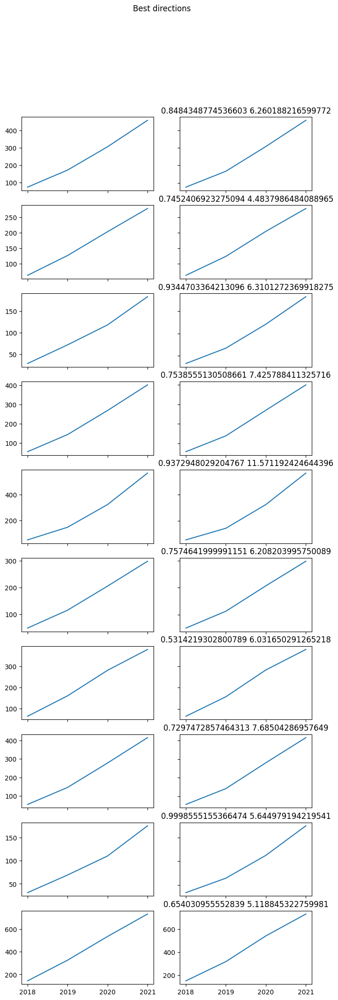

In [102]:
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

highs = []

for i,t in enumerate(sorted_topics[:10]):
    if t[0] not in progress_stat:    
        progress_stat[t[0]] = {}

    for y in range(2018,2022):
        if y not in progress_stat[t[0]]:
            progress_stat[t[0]][y] = 0

def mu(x, L, x0, k):
    return 4 * np.exp(-k * (x - x0)) / ((1+np.exp(-k * (x - x0)))**2)

fig, axs = plt.subplots(10,2, figsize=(8, 24))
fig.suptitle('Best directions')

def logistic_function(x, L, x0, k):
    return L / (1 + np.exp(-k * (x - x0)))

for i,t in enumerate(sorted_topics[:10]):
    years, vals = zip(*sorted(progress_stat[t[0]].items(),key=lambda x: x[0]))
    cum_vals = []
    last = 0
    for v in vals:
        last = v + last
        cum_vals.append(last)
    axs[i,0].plot(years, cum_vals)

    initial_guess = [max(cum_vals), np.median(years), 1]
    params, covariance = curve_fit(logistic_function, years, cum_vals, p0=initial_guess)
    L_fit, x0_fit, k_fit = params
    

    def func(L,x0,k):
        s = []
        for j in range(2018,2022):
            s.append(logistic_function(j, L, x0, k))
        return s   
    axs[i,1].plot(years, func(L_fit, x0_fit, k_fit))
    axs[i,1].set_title(str( mu(2021,L_fit, x0_fit, k_fit))+" " + str(float(cum_vals[len(cum_vals) - 1])/(cum_vals[0]+0.001)))
    

    highs.append(float(cum_vals[len(cum_vals) - 1])/(cum_vals[0]+1))

    if i < 9:
        axs[i,0].label_outer()
        axs[i,1].label_outer()

# 10 worst

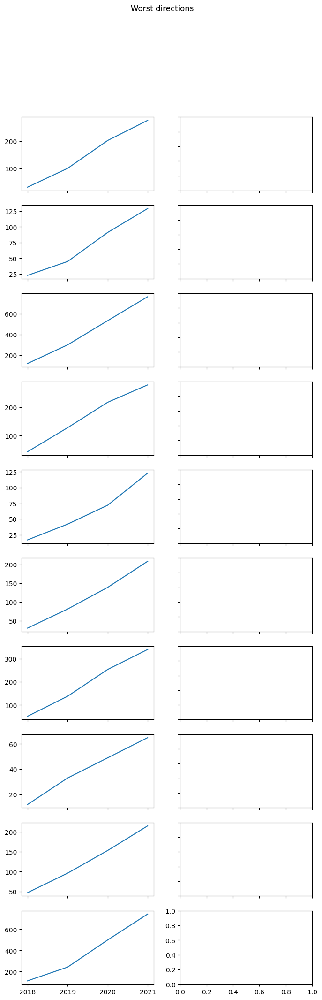

In [103]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(10,2, figsize=(8, 24))
fig.suptitle('Worst directions')

lows = []

def mu(x, L, x0, k):
    return 4 * np.exp(-k * (x - x0)) / ((1+np.exp(-k * (x - x0)))**2)

def logistic_function(x, L, x0, k):
    return L / (1 + np.exp(-k * (x - x0)))

for i,t in enumerate(sorted_topics[-10:]):
    if t[0] not in progress_stat:    
        progress_stat[t[0]] = {}

    for y in range(2018,2022):
        if y not in progress_stat[t[0]]:
            progress_stat[t[0]][y] = 0

for i,t in enumerate(sorted_topics[-10:]):
    years, vals = zip(*sorted(progress_stat[t[0]].items(),key=lambda x: x[0]))
    cum_vals = []
    last = 0
    for v in vals:
        last = v + last
        cum_vals.append(last)
    axs[i,0].plot(years, cum_vals)

    # initial_guess = [max(cum_vals), np.median(years), 1]
    # params, covariance = curve_fit(logistic_function, years, cum_vals, p0=initial_guess)
    # L_fit, x0_fit, k_fit = params
    

    # def func(L,x0,k):
    #     s = []
    #     for j in range(2017,2022):
    #         s.append(logistic_function(j, L, x0, k))
    #     return s   
    # axs[i,1].plot(years, func(L_fit, x0_fit, k_fit))
    # axs[i,1].set_title(str( mu(2021,L_fit, x0_fit, k_fit)) +" " + str(float(cum_vals[len(cum_vals) - 1])/(cum_vals[0]+0.001)))

    lows.append(float(cum_vals[len(cum_vals) - 1])/(cum_vals[0]+1)) 

    if i < 9:
        axs[i,0].label_outer()
        axs[i,1].label_outer()

In [104]:
from scipy.stats import mannwhitneyu

mannwhitneyu(highs,lows,method="exact")

MannwhitneyuResult(statistic=45.0, pvalue=0.7393643508194593)

In [105]:
# highs > lows 

In [106]:
mannwhitneyu(highs,lows,method="exact",alternative='greater')

MannwhitneyuResult(statistic=45.0, pvalue=0.6578947368421053)

In [107]:
highs,lows

([6.175675675675675,
  4.412698412698413,
  6.1,
  7.290909090909091,
  11.34,
  6.081632653061225,
  5.9375,
  7.545454545454546,
  5.46875,
  5.083333333333333],
 [8.393939393939394,
  5.375,
  6.270491803278689,
  6.177777777777778,
  6.833333333333333,
  6.741935483870968,
  6.5576923076923075,
  5.0,
  4.479166666666667,
  6.592920353982301])

# Citation analysis

In [108]:
df = pd.read_excel("2018try.xlsx")

title2cite = {}
for i,row in df.iterrows():
    title = row["title"].lower().strip()
    title2cite[title] = int(row["cite"])

In [109]:
topic2cites = {}
for i,row in rews.iterrows():
    title = row['title'].lower().strip()
    content = row['text']
    _,_,tscore,tn = topic_model.query_topics(content, 1,reduced=True)
    cits = title2cite.get(title, 0) 
    if tn[0] not in topic2cites:
        topic2cites[tn[0]] = []
    topic2cites[tn[0]].append(cits)
    

## 10 best

In [110]:
highs_cite = []

for i,t in enumerate(sorted_topics[:10]):
    top_id = t[0]
    cites = topic2cites[top_id]
    avg_cites = np.asarray(cites).mean()
    highs_cite.append(avg_cites)

## 10 worst

In [111]:
lows_cite = []

for i,t in enumerate(sorted_topics[-10:]):
    top_id = t[0]
    cites = topic2cites[top_id]
    avg_cites = np.asarray(cites).mean()
    lows_cite.append(avg_cites)

In [112]:
highs_cite

[190.25,
 14.75,
 41.4,
 105.5,
 35.0,
 160.3,
 86.0,
 114.33333333333333,
 22.833333333333332,
 48.333333333333336]

In [113]:
lows_cite

[0.16666666666666666,
 6.7,
 75.0,
 4.7727272727272725,
 2.3333333333333335,
 2.5,
 3.857142857142857,
 2.144578313253012,
 19.666666666666668,
 17.2]

In [114]:
mannwhitneyu(highs_cite,lows_cite,method="exact",alternative='greater')

MannwhitneyuResult(statistic=93.0, pvalue=0.00024356448505055315)

# Get topic scores with the classifier

In [123]:
import torch
import evaluate
from transformers import TrainingArguments, Trainer
from sklearn.model_selection import train_test_split
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from sklearn.preprocessing import LabelEncoder
from datasets import Dataset, DatasetDict
import pandas as pd
from transformers import DataCollatorWithPadding
import numpy as np

#encoder = LabelEncoder()
#encoder.fit(dataset['label'])

In [124]:
scores = [int(row['score'][row['score'].rfind("#")+1:row["score"].rfind(":")]) for _,row in rews.iterrows()]
triple_scores = []
for score in scores:
    if score > 6:
        score = "high"
    else:
        if score > 4:
            score = "medium"
        else:
            score = "low"
    triple_scores.append(score)

In [125]:
encoder = LabelEncoder()
encoder.fit(triple_scores)

LabelEncoder()

In [126]:
encoder.inverse_transform([0,1,2])

array(['high', 'low', 'medium'], dtype='<U6')

In [147]:
%load_ext autoreload
%autoreload 2

import warnings
import torch
import evaluate
from transformers import TrainingArguments, Trainer
from sklearn.model_selection import train_test_split
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from sklearn.preprocessing import LabelEncoder
from datasets import Dataset, DatasetDict
import pandas as pd
from transformers import DataCollatorWithPadding
import numpy as np


model_name = "roberta-base"

tokenizer = AutoTokenizer.from_pretrained(model_name)
device = "cpu"

def preprocess_function(examples):
    return tokenizer([str(e) for e in examples["text"]], truncation=True, max_length=512)

cls_model = AutoModelForSequenceClassification.from_pretrained("review_clf_model2question" + model_name + "/checkpoint-450",num_labels=3)

data_collator = DataCollatorWithPadding(
        tokenizer=tokenizer,
        padding='longest',
        max_length=512,
        pad_to_multiple_of=8,
        return_tensors='pt',
    )

device = "cpu"


# def compute_metrics(eval_pred):
#     predictions, labels = eval_pred
#     predictions = np.argmax(predictions, -1)
#     return accuracy.compute(predictions=predictions, references=labels)

training_args = TrainingArguments(
    output_dir="review_clf_model_without_NEW" + model_name,
    learning_rate=2e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=10,
    weight_decay=0.01, 
    warmup_ratio=0.15,
    max_grad_norm=1.0,    
    push_to_hub=False,
    no_cuda=True
)

trainer = Trainer(
   model=cls_model,
   args=training_args,
   tokenizer=tokenizer,
   data_collator=data_collator,
)
    

warnings.filterwarnings('ignore') 
    
from top2vec.Top2Vec.top2vec import Top2Vec

df =rews
dat = []
dists = []

top2score = {}
for i, row in df.iterrows():
    _,_,ts,tn = topic_model.query_topics(row["text"], 1,reduced = True)
    txt = row['review']
    qtags = row["review"].count("?")
 
    if qtags > 1:
        txt = "MANY_QUESTIONS" + " " + txt   
    
    tokens = tokenizer(txt, truncation=True)
    predictions = trainer.predict([tokens])
    lbl = np.argmax(predictions.predictions, axis=-1)    
    score = 0
    if lbl == 0:
        score = 2
    if lbl == 2:
        score = 1

    dists.append(ts[0])
    if tn[0] not in top2score:
        top2score[tn[0]] = []
    top2score[tn[0]].append(score)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [148]:
sorted_topics2 = sorted([[t,np.asarray(top2score[t]).mean(),len(top2score[t])] for t in top2score if len(top2score[t]) > 9],key=lambda x: x[1],reverse=True)

In [149]:
sorted_topics2

[[187, 1.8333333333333333, 12],
 [236, 1.5, 12],
 [251, 1.4444444444444444, 18],
 [231, 1.4166666666666667, 12],
 [221, 1.4, 10],
 [242, 1.3333333333333333, 12],
 [273, 1.3, 30],
 [276, 1.2666666666666666, 15],
 [299, 1.2, 15],
 [54, 1.2, 10],
 [272, 1.1666666666666667, 18],
 [226, 1.1666666666666667, 12],
 [271, 1.1666666666666667, 24],
 [264, 1.1333333333333333, 15],
 [204, 1.1333333333333333, 15],
 [261, 1.1111111111111112, 18],
 [106, 1.0833333333333333, 12],
 [269, 1.0833333333333333, 12],
 [289, 1.0666666666666667, 15],
 [265, 1.0666666666666667, 15],
 [244, 1.0555555555555556, 18],
 [105, 1.0555555555555556, 18],
 [133, 1.0512820512820513, 39],
 [284, 1.0333333333333334, 30],
 [121, 1.0, 18],
 [129, 1.0, 18],
 [178, 1.0, 22],
 [290, 1.0, 18],
 [200, 1.0, 12],
 [8, 1.0, 21],
 [247, 1.0, 12],
 [293, 1.0, 12],
 [281, 1.0, 12],
 [282, 1.0, 12],
 [295, 0.9666666666666667, 30],
 [286, 0.9666666666666667, 30],
 [266, 0.9444444444444444, 18],
 [208, 0.9444444444444444, 36],
 [202, 0.921

# 10 best

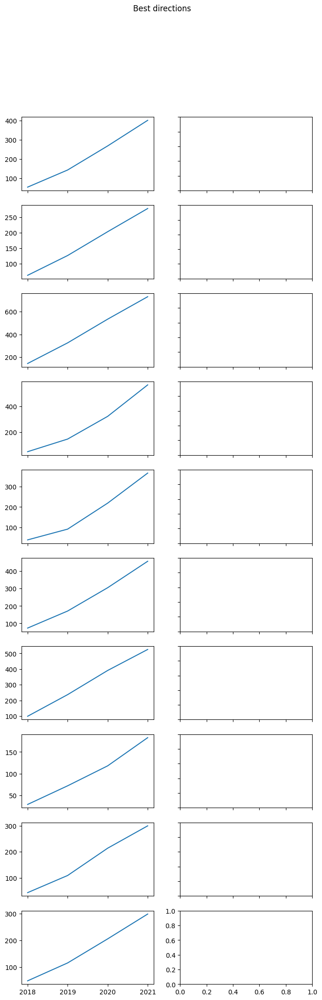

In [150]:
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

highs = []

for i,t in enumerate(sorted_topics2[:10]):
    if t[0] not in progress_stat:    
        progress_stat[t[0]] = {}

    for y in range(2018,2022):
        if y not in progress_stat[t[0]]:
            progress_stat[t[0]][y] = 0

def mu(x, L, x0, k):
    return 4 * np.exp(-k * (x - x0)) / ((1+np.exp(-k * (x - x0)))**2)

fig, axs = plt.subplots(10,2, figsize=(8, 24))
fig.suptitle('Best directions')

def logistic_function(x, L, x0, k):
    return L / (1 + np.exp(-k * (x - x0)))

for i,t in enumerate(sorted_topics2[:10]):
    years, vals = zip(*sorted(progress_stat[t[0]].items(),key=lambda x: x[0]))
    cum_vals = []
    last = 0
    for v in vals:
        last = v + last
        cum_vals.append(last)
    axs[i,0].plot(years, cum_vals)

    # initial_guess = [max(cum_vals), np.median(years), 1]
    # params, covariance = curve_fit(logistic_function, years, cum_vals, p0=initial_guess)
    # L_fit, x0_fit, k_fit = params
    

    # def func(L,x0,k):
    #     s = []
    #     for j in range(2017,2022):
    #         s.append(logistic_function(j, L, x0, k))
    #     return s   
    # axs[i,1].plot(years, func(L_fit, x0_fit, k_fit))
    # axs[i,1].set_title(str( mu(2021,L_fit, x0_fit, k_fit))+" " + str(float(cum_vals[len(cum_vals) - 1])/(cum_vals[0]+0.001)))
    highs.append(float(cum_vals[len(cum_vals) - 1])/(cum_vals[0]+1))
    if i < 9:
        axs[i,0].label_outer()
        axs[i,1].label_outer()

# 10 worst

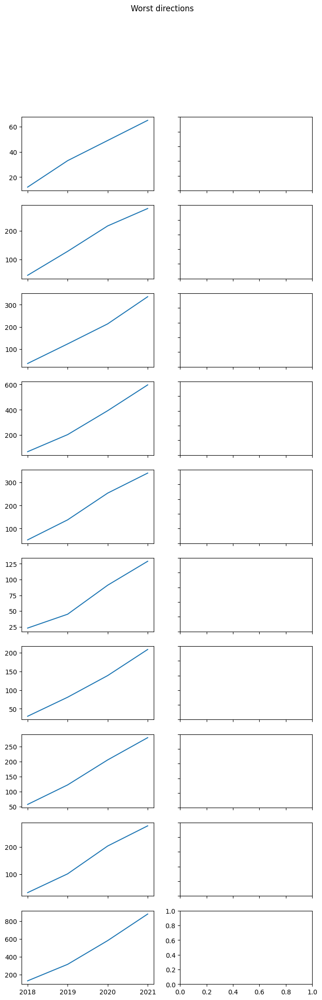

In [151]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(10,2, figsize=(8, 24))
fig.suptitle('Worst directions')

lows = []

def mu(x, L, x0, k):
    return 4 * np.exp(-k * (x - x0)) / ((1+np.exp(-k * (x - x0)))**2)

def logistic_function(x, L, x0, k):
    return L / (1 + np.exp(-k * (x - x0)))

for i,t in enumerate(sorted_topics2[-10:]):
    if t[0] not in progress_stat:    
        progress_stat[t[0]] = {}

    for y in range(2018,2022):
        if y not in progress_stat[t[0]]:
            progress_stat[t[0]][y] = 0

for i,t in enumerate(sorted_topics2[-10:]):
    years, vals = zip(*sorted(progress_stat[t[0]].items(),key=lambda x: x[0]))
    cum_vals = []
    last = 0
    for v in vals:
        last = v + last
        cum_vals.append(last)
    axs[i,0].plot(years, cum_vals)

    # initial_guess = [max(cum_vals), np.median(years), 1]
    # params, covariance = curve_fit(logistic_function, years, cum_vals, p0=initial_guess)
    # L_fit, x0_fit, k_fit = params
    

    # def func(L,x0,k):
    #     s = []
    #     for j in range(2017,2022):
    #         s.append(logistic_function(j, L, x0, k))
    #     return s   
    # axs[i,1].plot(years, func(L_fit, x0_fit, k_fit))
    # axs[i,1].set_title(str( mu(2021,L_fit, x0_fit, k_fit)) +" " + str(float(cum_vals[len(cum_vals) - 1])/(cum_vals[0]+0.001)))

    lows.append(float(cum_vals[len(cum_vals) - 1])/(cum_vals[0]+1)) 

    if i < 9:
        axs[i,0].label_outer()
        axs[i,1].label_outer()

In [152]:
mannwhitneyu(highs,lows,method="exact",alternative='greater')

MannwhitneyuResult(statistic=47.0, pvalue=0.6020318690597328)

## citations with cls

In [153]:
highs_cite = []

for i,t in enumerate(sorted_topics2[:10]):
    top_id = t[0]
    cites = topic2cites[top_id]
    avg_cites = np.asarray(cites).mean()
    highs_cite.append(avg_cites)

lows_cite = []

for i,t in enumerate(sorted_topics2[-10:]):
    top_id = t[0]
    cites = topic2cites[top_id]
    avg_cites = np.asarray(cites).mean()
    lows_cite.append(avg_cites)

mannwhitneyu(highs_cite,lows_cite,method="exact",alternative='greater')

MannwhitneyuResult(statistic=75.0, pvalue=0.03150641927731711)

In [154]:
highs_cite, lows_cite 

([105.5,
  14.75,
  48.333333333333336,
  35.0,
  16.1,
  190.25,
  32.2,
  41.4,
  44.8,
  160.3],
 [2.144578313253012,
  4.7727272727272725,
  37.75,
  147.75,
  3.857142857142857,
  6.7,
  2.5,
  126.75,
  0.16666666666666666,
  44.5])